<a href="https://colab.research.google.com/github/NatP-dev/Case_06/blob/main/Daily_Interest_Rates_Data_Analysis_29052025_1700.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Daily Interest Rates**

#### **Author**: Group X

## **<font color='#474747'>0 - Imports**</font>



In [ ]:
################################ LIBRARIES ########################
# -------------------------- Core Libraries -------------------------- #
import os
import pandas as pd
import re
from IPython.display import display
import numpy as np


# -------------------------- Plotting -------------------------- #
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import seaborn as sns
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots

from scipy.stats import zscore
import plotly.graph_objects as go
from collections import Counter
from collections import defaultdict


from pandas.tseries.holiday import AbstractHolidayCalendar, Holiday, nearest_workday, Easter, GoodFriday, EasterMonday
from datetime import date, timedelta
from dateutil.easter import easter

---
---
<br><br>
# **<font color='#000058'>Chapter 1: Data</font>**



## **<font color='#474747'>1.1 - Load All Data Files**

In [ ]:
# Step 1: Mount your Google Drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Step 2: Set the path to your folder containing the 31 CSV files
# Replace this path with the actual folder path inside your Drive
folder_path = '/content/drive/MyDrive/EMAS 14 Case 6/Data/Interest Rates/Daily'


In [ ]:
# Step 3: Load all CSV files into a list of DataFrames
csv_files = [f for f in os.listdir(folder_path) if f.endswith('.csv')]

# Optional: Sort filenames to maintain a consistent order
csv_files.sort()

In [ ]:
# Step 4: Read all CSV files
dataframes = []
for file in csv_files:
    full_path = os.path.join(folder_path, file)
    df = pd.read_csv(full_path)
    dataframes.append(df)

# Now `dataframes` is a list of 31 DataFrames (one per CSV)
# Example: access the first DataFrame
print(dataframes[0].head())

          Unnamed: 0 BBSIS.D.I.ZST.ZI.EUR.S1311.B.A604.R005X.R.A.A._Z._Z.A  \
0                NaN  Term structure of interest rates on listed Fed...      
1            Comment  Monatsendstandsreihe: WZ9807. Bis Juli 1997 li...      
2           Decimals                                                  2      
3   Time format code                                                P1D      
4  Unit (in english)                                            percent      

  BBSIS.D.I.ZST.ZI.EUR.S1311.B.A604.R005X.R.A.A._Z._Z.A_FLAGS  
0                                                NaN           
1                                                NaN           
2                                                NaN           
3                                                NaN           
4                                                NaN           


In [ ]:
# Loop for files into their own dataframes
for i in range(len(dataframes)):
    print(f"DataFrame {i}: {csv_files[i]}")

DataFrame 0: daily-term-structure-spot-interest-rate-R005X.csv
DataFrame 1: daily-term-structure-spot-interest-rate-R01XX.csv
DataFrame 2: daily-term-structure-spot-interest-rate-R02XX.csv
DataFrame 3: daily-term-structure-spot-interest-rate-R03XX.csv
DataFrame 4: daily-term-structure-spot-interest-rate-R04XX.csv
DataFrame 5: daily-term-structure-spot-interest-rate-R05XX.csv
DataFrame 6: daily-term-structure-spot-interest-rate-R06XX.csv
DataFrame 7: daily-term-structure-spot-interest-rate-R07XX.csv
DataFrame 8: daily-term-structure-spot-interest-rate-R08XX.csv
DataFrame 9: daily-term-structure-spot-interest-rate-R09XX.csv
DataFrame 10: daily-term-structure-spot-interest-rate-R10XX.csv
DataFrame 11: daily-term-structure-spot-interest-rate-R11XX.csv
DataFrame 12: daily-term-structure-spot-interest-rate-R12XX.csv
DataFrame 13: daily-term-structure-spot-interest-rate-R13XX.csv
DataFrame 14: daily-term-structure-spot-interest-rate-R14XX.csv
DataFrame 15: daily-term-structure-spot-interest-r

### **<font color='#474747'>*1.1 - Format Dataframes Consistently*</font>**
What was done to format the files:
1. Start at row 11
2. Have no headers
3. Rename columns:
  * Column 1: Date (convert to datetime)
  * Column 2: Value (float, 2 decimals)
  * Column 3: Info message like "No value available"
4. Add a new column FileReferenceName with the filename.



In [ ]:
# Step 5: Read all CSVs from row 11 onward, format consistently
dataframes = []

for file in csv_files:
    full_path = os.path.join(folder_path, file)

    df = pd.read_csv(full_path, skiprows=10, header=None, dtype=str, encoding='utf-8')
    df.columns = ["Date", "Interest Rate", "Information No IR"]

    # Clean and parse columns
    df["Date"] = df["Date"].str.strip()
    df["Date"] = pd.to_datetime(df["Date"], format="%Y-%m-%d", errors="coerce")
    df["Interest Rate"] = pd.to_numeric(df["Interest Rate"], errors="coerce")
    df["FileReferenceName"] = file

    dataframes.append(df)

# Adjust maturity assignment, with special handling for R005X
for df in dataframes:
    file_name = df["FileReferenceName"].iloc[0]

    if "R005X" in file_name:
        df["Maturity"] = 0.5
    else:
        match = re.search(r"R(\d{2})X", file_name)
        if match:
            df["Maturity"] = int(match.group(1))  # e.g., R01XX → 1
        else:
            df["Maturity"] = None  # fallback


In [ ]:
# CHECK DATA MANUALLY (Ensure alignment with excels)
# Head
display(dataframes[0].head(5))

# Tail
display(dataframes[0].tail(5))

,Date,Interest Rate,Information No IR,FileReferenceName,Maturity
0,1997-08-01,NaN,No value available,daily-term-structure-spot-interest-rate-R005X.csv,0.5
1,1997-08-02,NaN,No value available,daily-term-structure-spot-interest-rate-R005X.csv,0.5
2,1997-08-03,NaN,No value available,daily-term-structure-spot-interest-rate-R005X.csv,0.5
3,1997-08-04,NaN,No value available,daily-term-structure-spot-interest-rate-R005X.csv,0.5
4,1997-08-05,NaN,No value available,daily-term-structure-spot-interest-rate-R005X.csv,0.5


,Date,Interest Rate,Information No IR,FileReferenceName,Maturity
10145,2025-05-11,NaN,No value available,daily-term-structure-spot-interest-rate-R005X.csv,0.5
10146,2025-05-12,1.93,NaN,daily-term-structure-spot-interest-rate-R005X.csv,0.5
10147,2025-05-13,1.95,NaN,daily-term-structure-spot-interest-rate-R005X.csv,0.5
10148,2025-05-14,1.94,NaN,daily-term-structure-spot-interest-rate-R005X.csv,0.5
10149,2025-05-15,1.93,NaN,daily-term-structure-spot-interest-rate-R005X.csv,0.5


## **<font color='#474747'>1.2 - Data Pre-processing**

In [ ]:
### INFORMATION ON DATA PER FILE
# Collect info summary per DataFrame
summary_rows = []

for df in dataframes:
    maturity = df["Maturity"].iloc[0]  # Use the already existing numeric Maturity value
    row = {"Maturity": maturity, "Rows": len(df)}

    for col in df.columns:
        row[f"{col} | Non-Null"] = df[col].notnull().sum()
        row[f"{col} | Dtype"] = str(df[col].dtype)

    summary_rows.append(row)

# Create summary table
summary_df = pd.DataFrame(summary_rows)
summary_df.set_index("Maturity", inplace=True)
summary_df = summary_df.sort_index()

# Display in notebook (nicely formatted)
from IPython.display import display
display(summary_df)


,Rows,Date | Non-Null,Date | Dtype,Interest Rate | Non-Null,Interest Rate | Dtype,Information No IR | Non-Null,Information No IR | Dtype,FileReferenceName | Non-Null,FileReferenceName | Dtype,Maturity | Non-Null,Maturity | Dtype
Maturity,,,,,,,,,,,
0.5,10150,10150,datetime64[ns],7048,float64,3102,object,10150,object,10150,float64
1.0,10150,10150,datetime64[ns],7048,float64,3102,object,10150,object,10150,int64
2.0,10150,10150,datetime64[ns],7048,float64,3102,object,10150,object,10150,int64
3.0,10150,10150,datetime64[ns],7048,float64,3102,object,10150,object,10150,int64
4.0,10150,10150,datetime64[ns],7048,float64,3102,object,10150,object,10150,int64
5.0,10150,10150,datetime64[ns],7048,float64,3102,object,10150,object,10150,int64
6.0,10150,10150,datetime64[ns],7048,float64,3102,object,10150,object,10150,int64
7.0,10150,10150,datetime64[ns],7048,float64,3102,object,10150,object,10150,int64
8.0,10150,10150,datetime64[ns],7048,float64,3102,object,10150,object,10150,int64


In [ ]:
### DESCRIBE() DATA
for i, df in enumerate(dataframes):
    # Get file/maturity label
    file_name = df["FileReferenceName"].iloc[0]
    maturity = re.search(r"(R\d+X)", file_name).group(1)

    print(f"\n--- Summary Statistics for {maturity} ({file_name}) ---")
    print(df.describe())



--- Summary Statistics for R005X (daily-term-structure-spot-interest-rate-R005X.csv) ---
                                Date  Interest Rate  Maturity
count                          10150    7048.000000   10150.0
mean   2011-06-23 11:59:59.999999744       1.520241       0.5
min              1997-08-01 00:00:00      -0.980000       0.5
25%              2004-07-12 06:00:00      -0.250000       0.5
50%              2011-06-23 12:00:00       1.655000       0.5
75%              2018-06-03 18:00:00       3.322500       0.5
max              2025-05-15 00:00:00       5.120000       0.5
std                              NaN       1.833644       0.0

--- Summary Statistics for R01X (daily-term-structure-spot-interest-rate-R01XX.csv) ---
                                Date  Interest Rate  Maturity
count                          10150    7048.000000   10150.0
mean   2011-06-23 11:59:59.999999744       1.564343       1.0
min              1997-08-01 00:00:00      -0.970000       1.0
25%            

In [ ]:
### SUMMARIZE DESCRIBE() OF INTEREST RATE VALUES INTO ONE TABLE
summary_rows = []

for df in dataframes:
    maturity = df["Maturity"].iloc[0]  # Use numeric Maturity directly

    # Get describe for Interest Rate only
    stats = df[["Interest Rate"]].describe().T  # Transpose to get single row per maturity
    stats["Maturity"] = maturity
    summary_rows.append(stats)

# Combine all rows
summary_df = pd.concat(summary_rows)
summary_df.set_index("Maturity", inplace=True)

# Round numeric output
summary_df = summary_df.round(4)

# Display as a table
from IPython.display import display
display(summary_df)


,count,mean,std,min,25%,50%,75%,max
Maturity,,,,,,,,
0.5,7048.0,1.5202,1.8336,-0.98,-0.250,1.655,3.3225,5.12
1.0,7048.0,1.5643,1.8420,-0.97,-0.250,1.805,3.3100,5.23
2.0,7048.0,1.6612,1.8636,-1.02,-0.220,1.890,3.2800,5.32
3.0,7048.0,1.7815,1.8852,-1.02,-0.160,1.990,3.4325,5.33
4.0,7048.0,1.9147,1.9001,-1.00,-0.070,2.170,3.5800,5.35
5.0,7048.0,2.0511,1.9078,-0.98,0.050,2.320,3.7000,5.42
6.0,7048.0,2.1841,1.9099,-0.95,0.190,2.430,3.8400,5.48
7.0,7048.0,2.3099,1.9085,-0.93,0.330,2.480,3.9500,5.61
8.0,7048.0,2.4264,1.9054,-0.91,0.450,2.550,4.0700,5.73


In [ ]:
# Render the first DataFrame in a pretty HTML table (good for Colab)
dataframes[0]

,Date,Interest Rate,Information No IR,FileReferenceName,Maturity
0,1997-08-01,NaN,No value available,daily-term-structure-spot-interest-rate-R005X.csv,0.5
1,1997-08-02,NaN,No value available,daily-term-structure-spot-interest-rate-R005X.csv,0.5
2,1997-08-03,NaN,No value available,daily-term-structure-spot-interest-rate-R005X.csv,0.5
3,1997-08-04,NaN,No value available,daily-term-structure-spot-interest-rate-R005X.csv,0.5
4,1997-08-05,NaN,No value available,daily-term-structure-spot-interest-rate-R005X.csv,0.5
...,...,...,...,...,...
10145,2025-05-11,NaN,No value available,daily-term-structure-spot-interest-rate-R005X.csv,0.5
10146,2025-05-12,1.93,NaN,daily-term-structure-spot-interest-rate-R005X.csv,0.5
10147,2025-05-13,1.95,NaN,daily-term-structure-spot-interest-rate-R005X.csv,0.5
10148,2025-05-14,1.94,NaN,daily-term-structure-spot-interest-rate-R005X.csv,0.5



### **<font color='#474747'>*1.2.1 - General Data Checks*</font>**


#### **Date Column**

In [ ]:
#-------------------------------------   MISSING DATA CHECKS - Date Column -------------------------------------#
### DATE COLUMN(S)
# Prepare results list
date_analysis = []

for df in dataframes:
    # Use Maturity column directly
    maturity = df["Maturity"].iloc[0] if "Maturity" in df.columns else None

    # Get date column
    date_col = df["Date"]

    # Calculate required values
    min_date = date_col.min()
    max_date = date_col.max()
    total_rows = len(df)
    missing_count = date_col.isnull().sum()
    missing_pct = (missing_count / total_rows) * 100 if total_rows > 0 else 0

    # Incorrectly formatted = non-null values that are not datetime
    incorrectly_formatted = date_col.apply(lambda x: not isinstance(x, pd.Timestamp) and pd.notnull(x)).sum()

    # Calculate number of days between min and max date
    date_range_days = (max_date - min_date).days if pd.notnull(min_date) and pd.notnull(max_date) else None

    date_analysis.append({
        "Maturity": maturity,
        "Minimum Date": min_date,
        "Maximum Date": max_date,
        "Date Range (Days)": date_range_days,
        "Count Rows": total_rows,
        "Count Missing Dates": missing_count,
        "% Missing Dates": round(missing_pct, 2),
        "Incorrectly Formatted Data": incorrectly_formatted
    })

# Create summary DataFrame
date_summary_df = pd.DataFrame(date_analysis)
date_summary_df.set_index("Maturity", inplace=True)
date_summary_df.sort_index(inplace=True)

# Display the result
print("Date Column Analysis by Maturity")  # i.e. per file
display(date_summary_df)


Date Column Analysis by Maturity


,Minimum Date,Maximum Date,Date Range (Days),Count Rows,Count Missing Dates,% Missing Dates,Incorrectly Formatted Data
Maturity,,,,,,,
0.5,1997-08-01,2025-05-15,10149,10150,0,0.0,0
1.0,1997-08-01,2025-05-15,10149,10150,0,0.0,0
2.0,1997-08-01,2025-05-15,10149,10150,0,0.0,0
3.0,1997-08-01,2025-05-15,10149,10150,0,0.0,0
4.0,1997-08-01,2025-05-15,10149,10150,0,0.0,0
5.0,1997-08-01,2025-05-15,10149,10150,0,0.0,0
6.0,1997-08-01,2025-05-15,10149,10150,0,0.0,0
7.0,1997-08-01,2025-05-15,10149,10150,0,0.0,0
8.0,1997-08-01,2025-05-15,10149,10150,0,0.0,0


#### **Interest Rate Column**

In [ ]:
#-------------------------------------   MISSING DATA CHECKS - Interest Rate Column -------------------------------------#
### INTEREST RATE COLUMN(S)
# Prepare results list
ir_analysis = []

for df in dataframes:
    # Use Maturity column directly
    maturity = df["Maturity"].iloc[0] if "Maturity" in df.columns else None

    # Get interest rate column
    ir_col = df["Interest Rate"]

    # Basic statistics
    min_ir = ir_col.min()
    max_ir = ir_col.max()
    ir_range = max_ir - min_ir if pd.notnull(min_ir) and pd.notnull(max_ir) else None
    total_rows = len(df)
    missing_count = ir_col.isnull().sum()
    missing_pct = (missing_count / total_rows) * 100 if total_rows > 0 else 0

    # Incorrectly formatted = non-null values that are not floats or ints
    incorrectly_formatted = ir_col.apply(lambda x: not isinstance(x, (float, int)) and pd.notnull(x)).sum()

    ir_analysis.append({
        "Maturity": maturity,
        "Minimum Interest Rate": round(min_ir, 4) if pd.notnull(min_ir) else None,
        "Maximum Interest Rate": round(max_ir, 4) if pd.notnull(max_ir) else None,
        "Interest Rate Range": round(ir_range, 4) if ir_range is not None else None,
        "Count Rows": total_rows,
        "Count Missing Interest Rates": missing_count,
        "% Missing Interest Rates": round(missing_pct, 2),
        "Incorrectly Formatted Rates": incorrectly_formatted
    })

# Create summary DataFrame
ir_summary_df = pd.DataFrame(ir_analysis)
ir_summary_df.set_index("Maturity", inplace=True)
ir_summary_df.sort_index(inplace=True)

# Display the result
print("Interest Rate Column Analysis by Maturity (Including Weekends)")
display(ir_summary_df)


Interest Rate Column Analysis by Maturity (Including Weekends)


,Minimum Interest Rate,Maximum Interest Rate,Interest Rate Range,Count Rows,Count Missing Interest Rates,% Missing Interest Rates,Incorrectly Formatted Rates
Maturity,,,,,,,
0.5,-0.98,5.12,6.10,10150,3102,30.56,0
1.0,-0.97,5.23,6.20,10150,3102,30.56,0
2.0,-1.02,5.32,6.34,10150,3102,30.56,0
3.0,-1.02,5.33,6.35,10150,3102,30.56,0
4.0,-1.00,5.35,6.35,10150,3102,30.56,0
5.0,-0.98,5.42,6.40,10150,3102,30.56,0
6.0,-0.95,5.48,6.43,10150,3102,30.56,0
7.0,-0.93,5.61,6.54,10150,3102,30.56,0
8.0,-0.91,5.73,6.64,10150,3102,30.56,0


The above missing data is clearly quite high (sitting around 30%). The reason for this being primarily due to weekends and public holidays.

### **<font color='#474747'>*1.2.2 - Outlier Analysis (Extreme Values)*</font>**

#### **Date Column**

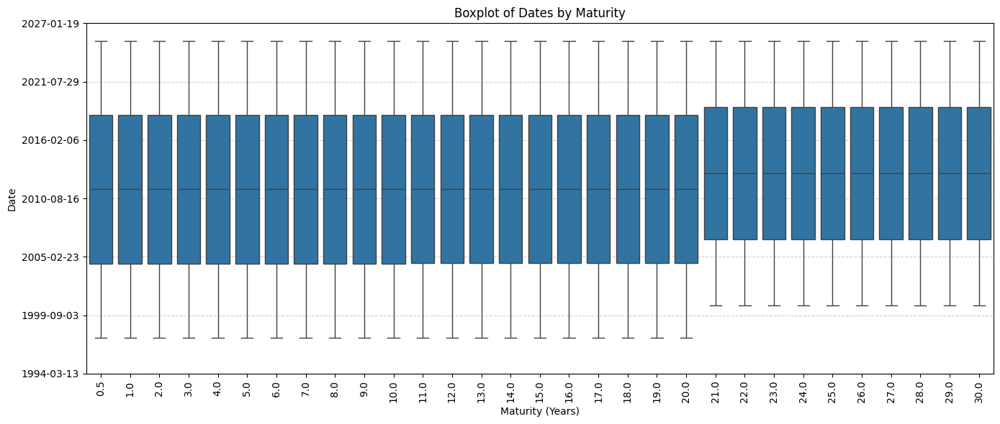

In [ ]:
#-------------------------------------   OUTLIER ANALYSIS - Date Column -------------------------------------#

# Prepare long-format date data for seaborn boxplot
date_long_df = []

for df in dataframes:
    maturity = df["Maturity"].iloc[0] if "Maturity" in df.columns else None

    for date in df["Date"].dropna():
        date_long_df.append({"Maturity": maturity, "Date": date})

# Create DataFrame
df_plot_date = pd.DataFrame(date_long_df)

# Convert datetime to ordinal for boxplot
df_plot_date["DateOrdinal"] = df_plot_date["Date"].map(pd.Timestamp.toordinal)

# Create the boxplot
plt.figure(figsize=(14, 6))
sns.boxplot(data=df_plot_date, x="Maturity", y="DateOrdinal", showfliers=False)
plt.title("Boxplot of Dates by Maturity")
plt.xlabel("Maturity (Years)")
plt.ylabel("Date")
plt.xticks(rotation=90)
plt.grid(True, axis="y", linestyle="--", alpha=0.6)

# Format y-axis back from ordinal to readable dates
locs, labels = plt.yticks()
plt.yticks(ticks=locs, labels=[pd.Timestamp.fromordinal(int(d)).strftime('%Y-%m-%d') for d in locs])

plt.tight_layout()
plt.show()


#### **Interest Rate Column**

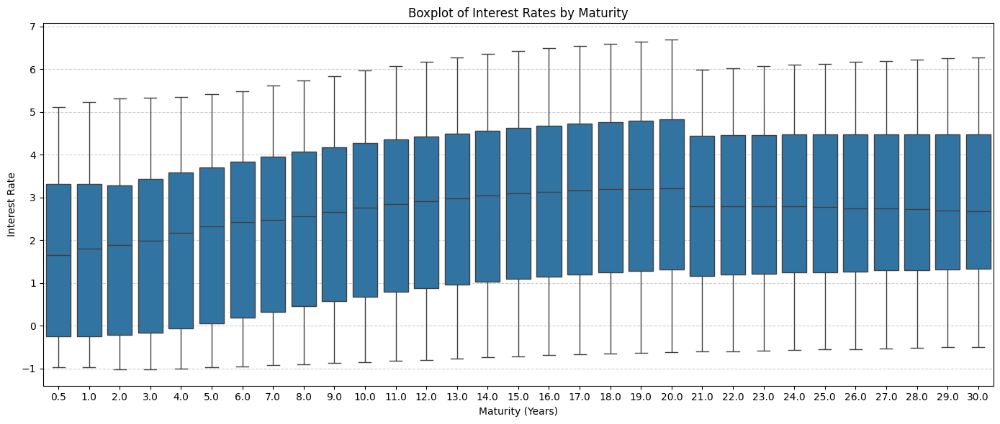

In [ ]:
#-------------------------------------- OUTLIER ANALYSIS - Interest Rate Column ---------------------------------------#

from scipy.stats import zscore

# Collect interest rate data
ir_long_df = []
outlier_counts_iqr = {}
outlier_counts_z = {}

for df in dataframes:
    maturity = df["Maturity"].iloc[0] if "Maturity" in df.columns else None
    series = df["Interest Rate"].dropna()

    if len(series) < 10:
        continue

    # Append to long-format DataFrame list
    ir_long_df.extend([{"Maturity": maturity, "Interest Rate": val} for val in series])

    # IQR outliers
    Q1 = series.quantile(0.25)
    Q3 = series.quantile(0.75)
    IQR = Q3 - Q1
    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR
    outliers_iqr = series[(series < lower) | (series > upper)]
    outlier_counts_iqr[maturity] = len(outliers_iqr)

    # Z-score outliers
    z_scores = zscore(series)
    outliers_z = series[(z_scores > 3) | (z_scores < -3)]
    outlier_counts_z[maturity] = len(outliers_z)

# Convert long-format data
df_plot_ir = pd.DataFrame(ir_long_df)

# Create boxplot
plt.figure(figsize=(14, 6))
sns.boxplot(data=df_plot_ir, x="Maturity", y="Interest Rate", showfliers=True)
plt.title("Boxplot of Interest Rates by Maturity")
plt.xlabel("Maturity (Years)")
plt.ylabel("Interest Rate")
plt.grid(True, axis="y", linestyle="--", alpha=0.6)
plt.tight_layout()
plt.show()

# #--------------------- Outlier Summary: IQR & Z-Score ---------------------#
# outlier_summary_df = pd.DataFrame({
#     "Maturity": list(outlier_counts_iqr.keys()),
#     "Total Outliers (IQR)": list(outlier_counts_iqr.values()),
#     "Total Outliers (Z-Score)": [outlier_counts_z.get(k, 0) for k in outlier_counts_iqr.keys()]
# }).sort_values("Maturity").set_index("Maturity")

# print("#--------------------- Outlier Summary: Interest Rate ---------------------#")
# display(outlier_summary_df)

# # Plot histogram of IQR outliers
# plt.figure(figsize=(12, 5))
# sns.barplot(x=outlier_summary_df.index, y=outlier_summary_df["Total Outliers (IQR)"], palette="coolwarm")
# plt.title("Outliers in Interest Rates (IQR Method)")
# plt.xlabel("Maturity")
# plt.ylabel("Outlier Count")
# plt.grid(True, axis='y', linestyle='--', alpha=0.6)
# plt.tight_layout()
# plt.show()


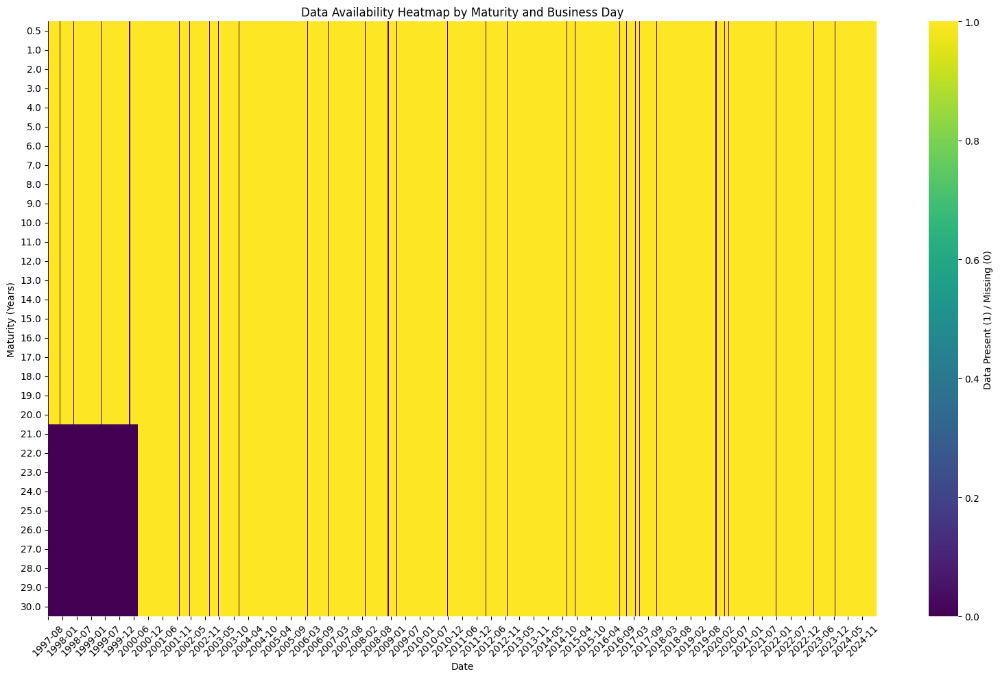

In [ ]:
#--------------------- Data Availability Heatmap by Maturity and Month ---------------------#

# Prepare date range covering all files
all_dates = pd.date_range(
    start=min(df['Date'].min() for df in dataframes),
    end=max(df['Date'].max() for df in dataframes),
    freq='B'  # Business days only
)

# Initialize empty DataFrame with dates as index
heatmap_df = pd.DataFrame(index=all_dates)

# Populate matrix with availability per maturity (1 = data present, 0 = missing)
for df in dataframes:
    maturity = df["Maturity"].iloc[0]
    temp = df[['Date', 'Interest Rate']].copy()
    temp['HasData'] = temp['Interest Rate'].notna().astype(int)
    temp.set_index('Date', inplace=True)
    temp = temp.reindex(all_dates, fill_value=0)
    heatmap_df[maturity] = temp['HasData']

# Reorder rows by maturity
heatmap_df = heatmap_df.T.sort_index()

# Format ticks for two per year
xtick_positions = range(0, len(heatmap_df.columns), int(len(heatmap_df.columns) / ((2025 - 1997 + 1) * 2)))
xtick_labels = [heatmap_df.columns[i].strftime('%Y-%m') for i in xtick_positions]

# Plot heatmap
plt.figure(figsize=(16, 10))
sns.heatmap(heatmap_df, cmap='viridis', cbar_kws={'label': 'Data Present (1) / Missing (0)'})
plt.title('Data Availability Heatmap by Maturity and Business Day')
plt.xlabel('Date')
plt.ylabel('Maturity (Years)')
plt.xticks(ticks=xtick_positions, labels=xtick_labels, rotation=45)
plt.tight_layout()
plt.show()


We can see from the above that for maturities 20-21 until 30 the years 1997-1999 are not present. This will not be analysed now,however will also not be removed as this may represent valuable information for the modeling.

### **<font color='#474747'>*1.2.3 - Data Quality Checks*</font>**

In [ ]:
print("----------------------------------------- DATA QUALITY CHECKS - per File  ---------------------------------------")

quality_checks = []

for df in dataframes:
    file_name = df["FileReferenceName"].iloc[0]
    maturity = df["Maturity"].iloc[0]  # Use the actual numeric Maturity column directly

    # Basic checks
    is_sorted = df["Date"].is_monotonic_increasing
    duplicate_rows = df.duplicated().sum()
    duplicate_dates = df["Date"].duplicated().sum()
    missing_counts = df.isnull().sum()
    total_missing = missing_counts.sum()

    # Negative or zero interest rate values
    ir_col = "Interest Rate"
    if ir_col in df.columns:
        negative_or_zero = (df[ir_col] <= 0).sum()
    else:
        negative_or_zero = None

    quality_checks.append({
        "Maturity": maturity,
        "File Name": file_name,
        "Dates Sorted?": is_sorted,
        "Duplicate Rows": duplicate_rows,
        "Duplicate Dates": duplicate_dates,
        "Missing in 'Date'": missing_counts.get("Date", 0),
        "Missing in 'Interest Rate'": missing_counts.get("Interest Rate", 0),
        "Negative/Zero Interest Rates": negative_or_zero
    })

# Create DataFrame
quality_df = pd.DataFrame(quality_checks)
quality_df.set_index("Maturity", inplace=True)
quality_df = quality_df.sort_index()

# Display summary
from IPython.display import display
display(quality_df)

print("\n**Data Quality Check Complete!**\n")


----------------------------------------- DATA QUALITY CHECKS - per File  ---------------------------------------


,File Name,Dates Sorted?,Duplicate Rows,Duplicate Dates,Missing in 'Date',Missing in 'Interest Rate',Negative/Zero Interest Rates
Maturity,,,,,,,
0.5,daily-term-structure-spot-interest-rate-R005X.csv,True,0,0,0,3102,2087
1.0,daily-term-structure-spot-interest-rate-R01XX.csv,True,0,0,0,3102,2208
2.0,daily-term-structure-spot-interest-rate-R02XX.csv,True,0,0,0,3102,2102
3.0,daily-term-structure-spot-interest-rate-R03XX.csv,True,0,0,0,3102,1920
4.0,daily-term-structure-spot-interest-rate-R04XX.csv,True,0,0,0,3102,1824
5.0,daily-term-structure-spot-interest-rate-R05XX.csv,True,0,0,0,3102,1698
6.0,daily-term-structure-spot-interest-rate-R06XX.csv,True,0,0,0,3102,1504
7.0,daily-term-structure-spot-interest-rate-R07XX.csv,True,0,0,0,3102,1245
8.0,daily-term-structure-spot-interest-rate-R08XX.csv,True,0,0,0,3102,997



**Data Quality Check Complete!**



### **<font color='#474747'>*1.2.4 - Missing Values Per XXX*</font>**


##### **1.2.4.1 - Missing Values - Per Day of Week**
* Count
* Percentage

In [ ]:
print("#------------------------------   MISSING VALUES - Per Working Day and Weekend ---------------#")

# Dictionaries to hold results
counts = []
percentages = []

for df in dataframes:
    maturity = df["Maturity"].iloc[0] if "Maturity" in df.columns else None

    # Filter valid date rows and create weekday column
    df = df[df["Date"].notnull()].copy()
    df["Weekday"] = df["Date"].dt.strftime("%A")

    # Count total per weekday
    total_counts = df["Weekday"].value_counts()

    # Count missing interest rates per weekday
    missing_counts = df[df["Interest Rate"].isnull()]["Weekday"].value_counts()

    row_counts = {"Maturity": maturity}
    row_percentages = {"Maturity": maturity}

    for day in ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"]:
        total = total_counts.get(day, 0)
        missing = missing_counts.get(day, 0)
        row_counts[day] = missing
        row_percentages[day] = round((missing / total * 100), 2) if total > 0 else None

    counts.append(row_counts)
    percentages.append(row_percentages)

# Convert to DataFrames
missing_counts_df = pd.DataFrame(counts).set_index("Maturity").sort_index()
missing_percent_df = pd.DataFrame(percentages).set_index("Maturity").sort_index()

# Display both
print("Missing Interest Rate Counts by Weekday:")
display(missing_counts_df)

print("Percentage Missing Interest Rates by Weekday:")
display(missing_percent_df)


#------------------------------   MISSING VALUES - Per Working Day and Weekend ---------------#
Missing Interest Rate Counts by Weekday:


,Monday,Tuesday,Wednesday,Thursday,Friday,Saturday,Sunday
Maturity,,,,,,,
0.5,64,28,26,29,55,1450,1450
1.0,64,28,26,29,55,1450,1450
2.0,64,28,26,29,55,1450,1450
3.0,64,28,26,29,55,1450,1450
4.0,64,28,26,29,55,1450,1450
5.0,64,28,26,29,55,1450,1450
6.0,64,28,26,29,55,1450,1450
7.0,64,28,26,29,55,1450,1450
8.0,64,28,26,29,55,1450,1450


Percentage Missing Interest Rates by Weekday:


,Monday,Tuesday,Wednesday,Thursday,Friday,Saturday,Sunday
Maturity,,,,,,,
0.5,4.41,1.93,1.79,2.00,3.79,100.0,100.0
1.0,4.41,1.93,1.79,2.00,3.79,100.0,100.0
2.0,4.41,1.93,1.79,2.00,3.79,100.0,100.0
3.0,4.41,1.93,1.79,2.00,3.79,100.0,100.0
4.0,4.41,1.93,1.79,2.00,3.79,100.0,100.0
5.0,4.41,1.93,1.79,2.00,3.79,100.0,100.0
6.0,4.41,1.93,1.79,2.00,3.79,100.0,100.0
7.0,4.41,1.93,1.79,2.00,3.79,100.0,100.0
8.0,4.41,1.93,1.79,2.00,3.79,100.0,100.0


###### **1.2.4.2.a - Heatmap Missing Values**

#------------------------------   HEATMAP MISSING VALUES - Per Work Day and Weekend  ---------------#


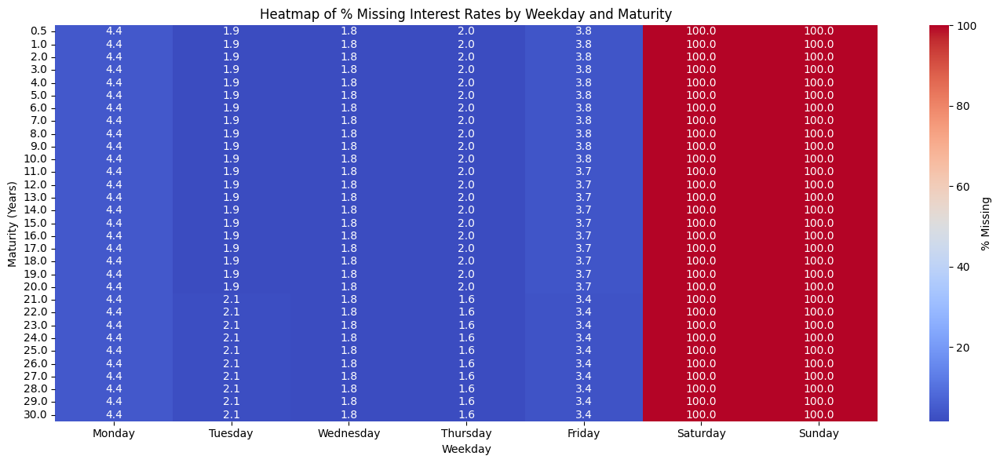

In [ ]:
print("#------------------------------   HEATMAP MISSING VALUES - Per Work Day and Weekend  ---------------#")
# Reorder weekday columns for better readability
weekday_order = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"]
heatmap_data = missing_percent_df[weekday_order]

# Plot heatmap
plt.figure(figsize=(14, 6))
sns.heatmap(heatmap_data, annot=True, fmt=".1f", cmap="coolwarm", cbar_kws={"label": "% Missing"})
plt.title("Heatmap of % Missing Interest Rates by Weekday and Maturity")
plt.xlabel("Weekday")
plt.ylabel("Maturity (Years)")
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

##### **1.2.4.2 - Missing Values - Per Month**
* Count
* Percentage

In [ ]:
#------------------------------   MISSING VALUES - Per Month ---------------#

# Storage for results
monthly_counts = []
monthly_percentages = []

for df in dataframes:
    maturity = df["Maturity"].iloc[0] if "Maturity" in df.columns else None

    # Ensure valid dates
    df = df[df["Date"].notnull()].copy()
    df["Month"] = df["Date"].dt.strftime("%B")

    # Count total and missing interest rates per month
    total_counts = df["Month"].value_counts()
    missing_counts = df[df["Interest Rate"].isnull()]["Month"].value_counts()

    row_counts = {"Maturity": maturity}
    row_percentages = {"Maturity": maturity}

    # Ensure consistent month order
    months = [
        "January", "February", "March", "April", "May", "June",
        "July", "August", "September", "October", "November", "December"
    ]

    for month in months:
        total = total_counts.get(month, 0)
        missing = missing_counts.get(month, 0)
        row_counts[month] = missing
        row_percentages[month] = round((missing / total * 100), 2) if total > 0 else None

    monthly_counts.append(row_counts)
    monthly_percentages.append(row_percentages)

# Create DataFrames
missing_month_counts_df = pd.DataFrame(monthly_counts).set_index("Maturity").sort_index()
missing_month_percent_df = pd.DataFrame(monthly_percentages).set_index("Maturity").sort_index()

# Display results
print("Missing Interest Rate Counts by Month:")
display(missing_month_counts_df)

print("Percentage Missing Interest Rates by Month:")
display(missing_month_percent_df)


Missing Interest Rate Counts by Month:


,January,February,March,April,May,June,July,August,September,October,November,December
Maturity,,,,,,,,,,,,
0.5,268,226,258,286,271,237,240,252,240,256,240,328
1.0,268,226,258,286,271,237,240,252,240,256,240,328
2.0,268,226,258,286,271,237,240,252,240,256,240,328
3.0,268,226,258,286,271,237,240,252,240,256,240,328
4.0,268,226,258,286,271,237,240,252,240,256,240,328
5.0,268,226,258,286,271,237,240,252,240,256,240,328
6.0,268,226,258,286,271,237,240,252,240,256,240,328
7.0,268,226,258,286,271,237,240,252,240,256,240,328
8.0,268,226,258,286,271,237,240,252,240,256,240,328


Percentage Missing Interest Rates by Month:


,January,February,March,April,May,June,July,August,September,October,November,December
Maturity,,,,,,,,,,,,
0.5,30.88,28.57,29.72,34.05,31.81,29.26,28.67,29.03,28.57,29.49,28.57,37.79
1.0,30.88,28.57,29.72,34.05,31.81,29.26,28.67,29.03,28.57,29.49,28.57,37.79
2.0,30.88,28.57,29.72,34.05,31.81,29.26,28.67,29.03,28.57,29.49,28.57,37.79
3.0,30.88,28.57,29.72,34.05,31.81,29.26,28.67,29.03,28.57,29.49,28.57,37.79
4.0,30.88,28.57,29.72,34.05,31.81,29.26,28.67,29.03,28.57,29.49,28.57,37.79
5.0,30.88,28.57,29.72,34.05,31.81,29.26,28.67,29.03,28.57,29.49,28.57,37.79
6.0,30.88,28.57,29.72,34.05,31.81,29.26,28.67,29.03,28.57,29.49,28.57,37.79
7.0,30.88,28.57,29.72,34.05,31.81,29.26,28.67,29.03,28.57,29.49,28.57,37.79
8.0,30.88,28.57,29.72,34.05,31.81,29.26,28.67,29.03,28.57,29.49,28.57,37.79


###### **1.2.4.2.a - Heatmap Missing Values**

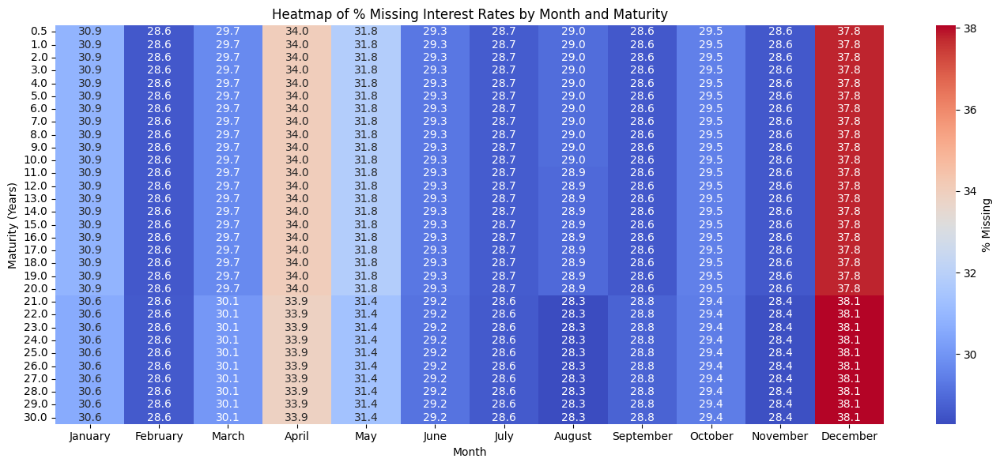

In [ ]:

# Reorder month columns for better readability
month_order = [
    "January", "February", "March", "April", "May", "June",
    "July", "August", "September", "October", "November", "December"
]

# Filter and reorder the columns in the percentage DataFrame
heatmap_data_month = missing_month_percent_df[month_order]

# Plot heatmap
plt.figure(figsize=(14, 6))
sns.heatmap(heatmap_data_month, annot=True, fmt=".1f", cmap="coolwarm", cbar_kws={"label": "% Missing"})
plt.title("Heatmap of % Missing Interest Rates by Month and Maturity")
plt.xlabel("Month")
plt.ylabel("Maturity (Years)")
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()


##### **1.2.4.3 - Missing Values - Per YYYY-MM**
* Count
* Percentage

In [ ]:
#------------------------------   MISSING VALUES - Per YYYY-MM ---------------#
# Storage for results
monthly_counts = []
monthly_percentages = []

for df in dataframes:
    maturity = df["Maturity"].iloc[0] if "Maturity" in df.columns else None

    df = df[df["Date"].notnull()].copy()
    df["Month"] = df["Date"].dt.to_period("M").astype(str)  # Format as 'YYYY-MM'

    total_counts = df["Month"].value_counts()
    missing_counts = df[df["Interest Rate"].isnull()]["Month"].value_counts()

    row_counts = {"Maturity": maturity}
    row_percentages = {"Maturity": maturity}

    for month in sorted(total_counts.index):  # Ensure sorted months
        total = total_counts.get(month, 0)
        missing = missing_counts.get(month, 0)
        row_counts[month] = missing
        row_percentages[month] = round((missing / total * 100), 2) if total > 0 else None

    monthly_counts.append(row_counts)
    monthly_percentages.append(row_percentages)

# Create DataFrames
missing_month_counts_df = pd.DataFrame(monthly_counts).set_index("Maturity").sort_index()
missing_month_percent_df = pd.DataFrame(monthly_percentages).set_index("Maturity").sort_index()

# Display results
print("Missing Interest Rate Counts by YYYY-MM:")
display(missing_month_counts_df)

print("Percentage Missing Interest Rates by YYYY-MM:")
display(missing_month_percent_df)


Missing Interest Rate Counts by YYYY-MM:


,1997-08,1997-09,1997-10,1997-11,1997-12,1998-01,1998-02,1998-03,1998-04,1998-05,...,2024-08,2024-09,2024-10,2024-11,2024-12,2025-01,2025-02,2025-03,2025-04,2025-05
Maturity,,,,,,,,,,,,,,,,,,,,,
0.5,14.0,8.0,9.0,10.0,12.0,10.0,8.0,9.0,10.0,12.0,...,9,9,8,9,13,9,8,10,10,5
1.0,14.0,8.0,9.0,10.0,12.0,10.0,8.0,9.0,10.0,12.0,...,9,9,8,9,13,9,8,10,10,5
2.0,14.0,8.0,9.0,10.0,12.0,10.0,8.0,9.0,10.0,12.0,...,9,9,8,9,13,9,8,10,10,5
3.0,14.0,8.0,9.0,10.0,12.0,10.0,8.0,9.0,10.0,12.0,...,9,9,8,9,13,9,8,10,10,5
4.0,14.0,8.0,9.0,10.0,12.0,10.0,8.0,9.0,10.0,12.0,...,9,9,8,9,13,9,8,10,10,5
5.0,14.0,8.0,9.0,10.0,12.0,10.0,8.0,9.0,10.0,12.0,...,9,9,8,9,13,9,8,10,10,5
6.0,14.0,8.0,9.0,10.0,12.0,10.0,8.0,9.0,10.0,12.0,...,9,9,8,9,13,9,8,10,10,5
7.0,14.0,8.0,9.0,10.0,12.0,10.0,8.0,9.0,10.0,12.0,...,9,9,8,9,13,9,8,10,10,5
8.0,14.0,8.0,9.0,10.0,12.0,10.0,8.0,9.0,10.0,12.0,...,9,9,8,9,13,9,8,10,10,5


Percentage Missing Interest Rates by YYYY-MM:


,1997-08,1997-09,1997-10,1997-11,1997-12,1998-01,1998-02,1998-03,1998-04,1998-05,...,2024-08,2024-09,2024-10,2024-11,2024-12,2025-01,2025-02,2025-03,2025-04,2025-05
Maturity,,,,,,,,,,,,,,,,,,,,,
0.5,45.16,26.67,29.03,33.33,38.71,32.26,28.57,29.03,33.33,38.71,...,29.03,30.0,25.81,30.0,41.94,29.03,28.57,32.26,33.33,33.33
1.0,45.16,26.67,29.03,33.33,38.71,32.26,28.57,29.03,33.33,38.71,...,29.03,30.0,25.81,30.0,41.94,29.03,28.57,32.26,33.33,33.33
2.0,45.16,26.67,29.03,33.33,38.71,32.26,28.57,29.03,33.33,38.71,...,29.03,30.0,25.81,30.0,41.94,29.03,28.57,32.26,33.33,33.33
3.0,45.16,26.67,29.03,33.33,38.71,32.26,28.57,29.03,33.33,38.71,...,29.03,30.0,25.81,30.0,41.94,29.03,28.57,32.26,33.33,33.33
4.0,45.16,26.67,29.03,33.33,38.71,32.26,28.57,29.03,33.33,38.71,...,29.03,30.0,25.81,30.0,41.94,29.03,28.57,32.26,33.33,33.33
5.0,45.16,26.67,29.03,33.33,38.71,32.26,28.57,29.03,33.33,38.71,...,29.03,30.0,25.81,30.0,41.94,29.03,28.57,32.26,33.33,33.33
6.0,45.16,26.67,29.03,33.33,38.71,32.26,28.57,29.03,33.33,38.71,...,29.03,30.0,25.81,30.0,41.94,29.03,28.57,32.26,33.33,33.33
7.0,45.16,26.67,29.03,33.33,38.71,32.26,28.57,29.03,33.33,38.71,...,29.03,30.0,25.81,30.0,41.94,29.03,28.57,32.26,33.33,33.33
8.0,45.16,26.67,29.03,33.33,38.71,32.26,28.57,29.03,33.33,38.71,...,29.03,30.0,25.81,30.0,41.94,29.03,28.57,32.26,33.33,33.33


###### **1.2.4.3.a - Heatmap Missing Values**

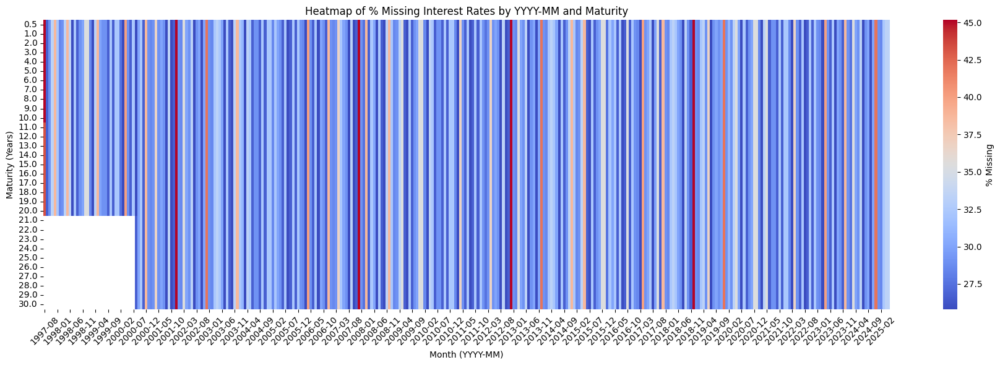

In [ ]:
#------------------------------   HEATMAP OF % MISSING - Per YYYY-MM ---------------#
# Ensure columns are sorted chronologically
heatmap_data_ym = missing_month_percent_df.copy()
heatmap_data_ym = heatmap_data_ym[sorted(heatmap_data_ym.columns)]

# Plot heatmap without annotations
plt.figure(figsize=(18, 6))
sns.heatmap(
    heatmap_data_ym,
    annot=False,  # <-- Remove annotations inside cells
    fmt=".1f",
    cmap="coolwarm",
    cbar_kws={"label": "% Missing"}
)
plt.title("Heatmap of % Missing Interest Rates by YYYY-MM and Maturity")
plt.xlabel("Month (YYYY-MM)")
plt.ylabel("Maturity (Years)")
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()


### **<font color='#474747'>*1.2.5 - Missing Values Per day of Week (Excluding Public Holidays)*</font>**
* Count
* Percentage

In [ ]:
#------------------------------   MISSING DATA - Per Weekday (Excluding Public Holidays and Weekends) ---------------#
from datetime import date as dt_date, timedelta
from dateutil.easter import easter

# ------------------------- Build Dynamic Public Holiday Calendar ----------------------- #
def get_excel_holidays(year):
    # Explicitly import date within the function to avoid shadowing
    from datetime import date
    e = easter(year)
    return set([
        date(year, 1, 1),           # New Year's Day
        e - timedelta(days=2),      # Good Friday
        e + timedelta(days=1),      # Easter Monday
        date(year, 5, 1),           # Labour Day
        date(year, 12, 24),         # Christmas Eve
        date(year, 12, 25),         # Christmas Day
        date(year, 12, 26),         # Boxing Day
        date(year, 12, 31),         # New Year's Eve
    ])

# Get date range across all files
all_dates = pd.concat([df["Date"] for df in dataframes if "Date" in df.columns]).dropna()
min_year, max_year = all_dates.min().year, all_dates.max().year

all_holidays = set()
for y in range(min_year, max_year + 1):
    all_holidays.update(get_excel_holidays(y))
holiday_dates = pd.to_datetime(list(all_holidays))

# ------------------------- Count Missing by Weekday (Excl. Holidays & Weekends) ----------------------- #
counts = []
percentages = []

for df in dataframes:
    maturity = df["Maturity"].iloc[0] if "Maturity" in df.columns else None

    df = df[df["Date"].notnull()].copy()

    # Exclude weekends
    df = df[~df["Date"].dt.weekday.isin([5, 6])].copy()

    # Exclude public holidays
    df = df[~df["Date"].isin(holiday_dates)].copy()

    # Add weekday label
    df["Weekday"] = df["Date"].dt.strftime("%A")

    total_counts = df["Weekday"].value_counts()
    missing_counts = df[df["Interest Rate"].isnull()]["Weekday"].value_counts()

    row_counts = {"Maturity": maturity}
    row_percentages = {"Maturity": maturity}

    for day in ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday"]:
        total = total_counts.get(day, 0)
        missing = missing_counts.get(day, 0)
        row_counts[day] = missing
        row_percentages[day] = round((missing / total * 100), 2) if total > 0 else None

    counts.append(row_counts)
    percentages.append(row_percentages)

# Create and display DataFrames
missing_counts_df = pd.DataFrame(counts).set_index("Maturity").sort_index()
missing_percent_df = pd.DataFrame(percentages).set_index("Maturity").sort_index()

print("Missing Interest Rate Counts by Weekday (Excl. Public Holidays and Weekends):")
display(missing_counts_df)

print("Percentage Missing Interest Rates by Weekday (Excl. Public Holidays and Weekends):")
display(missing_percent_df)

Missing Interest Rate Counts by Weekday (Excl. Public Holidays and Weekends):


,Monday,Tuesday,Wednesday,Thursday,Friday
Maturity,,,,,
0.5,12,4,2,5,3
1.0,12,4,2,5,3
2.0,12,4,2,5,3
3.0,12,4,2,5,3
4.0,12,4,2,5,3
5.0,12,4,2,5,3
6.0,12,4,2,5,3
7.0,12,4,2,5,3
8.0,12,4,2,5,3


Percentage Missing Interest Rates by Weekday (Excl. Public Holidays and Weekends):


,Monday,Tuesday,Wednesday,Thursday,Friday
Maturity,,,,,
0.5,0.86,0.28,0.14,0.35,0.21
1.0,0.86,0.28,0.14,0.35,0.21
2.0,0.86,0.28,0.14,0.35,0.21
3.0,0.86,0.28,0.14,0.35,0.21
4.0,0.86,0.28,0.14,0.35,0.21
5.0,0.86,0.28,0.14,0.35,0.21
6.0,0.86,0.28,0.14,0.35,0.21
7.0,0.86,0.28,0.14,0.35,0.21
8.0,0.86,0.28,0.14,0.35,0.21


* Saturday & Sunday are always 100% missing
→ No rates published on weekends (normal).

* Weekday missingness is low (mostly ~1.6–4.4%)
→ These are likely holidays, system outages, or publication lags.





###### **1.2.5.1 - Count of Missing Values per Maturity (Excl Weekends & Public Holidays)**


In [ ]:
#------------------------------   MISSING INTEREST RATE COUNT - Per File (Excl. Weekends and Holidays) ---------------#
from datetime import date as dt_date, timedelta
from dateutil.easter import easter

# ----------- Generate Public Holiday Set (Easter-based logic) -----------
def get_excel_holidays(year):
    from datetime import date
    e = easter(year)
    return set([
        date(year, 1, 1),           # New Year's Day
        e - timedelta(days=2),      # Good Friday
        e + timedelta(days=1),      # Easter Monday
        date(year, 5, 1),           # Labour Day
        date(year, 12, 24),         # Christmas Eve
        date(year, 12, 25),         # Christmas Day
        date(year, 12, 26),         # Boxing Day
        date(year, 12, 31),         # New Year's Eve
    ])

# ----------- Collect global date range from all files -----------
all_dates = pd.concat([df["Date"] for df in dataframes if "Date" in df.columns]).dropna()
min_year, max_year = all_dates.min().year, all_dates.max().year

# Build full set of holiday dates
all_holidays = set()
for y in range(min_year, max_year + 1):
    all_holidays.update(get_excel_holidays(y))
holiday_dates = pd.to_datetime(list(all_holidays))

# ----------- Run missing value analysis excluding holidays/weekends -----------
summary_stats = []

for df in dataframes:
    maturity = df["Maturity"].iloc[0] if "Maturity" in df.columns else None

    df = df[df["Date"].notnull()].copy()

    # Remove weekends
    df = df[~df["Date"].dt.weekday.isin([5, 6])].copy()

    # Remove public holidays
    df = df[~df["Date"].isin(holiday_dates)].copy()

    total_days = len(df)
    missing_ir = df["Interest Rate"].isnull().sum()
    missing_pct = (missing_ir / total_days) * 100 if total_days > 0 else 0

    summary_stats.append({
        "Maturity": maturity,
        "Filtered Business Days": total_days,
        "Missing Interest Rate Values": missing_ir,
        "% Missing (Excl. Holidays/Weekends)": round(missing_pct, 2)
    })

# Create and display results
missing_summary_df = pd.DataFrame(summary_stats).set_index("Maturity").sort_index()

print("Missing Interest Rate Values by File (Excl. Weekends and Public Holidays):")
display(missing_summary_df)


Missing Interest Rate Values by File (Excl. Weekends and Public Holidays):


,Filtered Business Days,Missing Interest Rate Values,% Missing (Excl. Holidays/Weekends)
Maturity,,,
0.5,7074,26,0.37
1.0,7074,26,0.37
2.0,7074,26,0.37
3.0,7074,26,0.37
4.0,7074,26,0.37
5.0,7074,26,0.37
6.0,7074,26,0.37
7.0,7074,26,0.37
8.0,7074,26,0.37


###### **1.2.5.2 - Heatmap & Table True Missing Values**

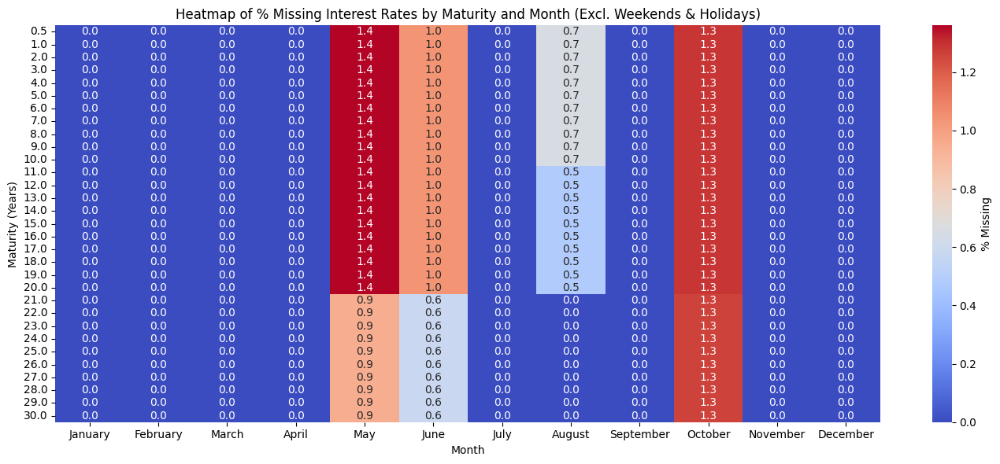

Total Missing Rows (Excl. Weekends & Holidays): 686


,Date,Interest Rate,Information No IR,FileReferenceName,Maturity
0,1997-08-01,NaN,No value available,daily-term-structure-spot-interest-rate-R005X.csv,0.5
1,1997-08-04,NaN,No value available,daily-term-structure-spot-interest-rate-R005X.csv,0.5
2,1997-08-05,NaN,No value available,daily-term-structure-spot-interest-rate-R005X.csv,0.5
3,1997-08-06,NaN,No value available,daily-term-structure-spot-interest-rate-R005X.csv,0.5
4,1997-10-03,NaN,No value available,daily-term-structure-spot-interest-rate-R005X.csv,0.5
5,1998-05-21,NaN,No value available,daily-term-structure-spot-interest-rate-R005X.csv,0.5
6,1998-06-01,NaN,No value available,daily-term-structure-spot-interest-rate-R005X.csv,0.5
7,1998-06-11,NaN,No value available,daily-term-structure-spot-interest-rate-R005X.csv,0.5
8,1999-05-13,NaN,No value available,daily-term-structure-spot-interest-rate-R005X.csv,0.5
9,1999-05-24,NaN,No value available,daily-term-structure-spot-interest-rate-R005X.csv,0.5


In [ ]:
#------------------------------   HEATMAP OF MISSING VALUES - Per File per Month (Excl. Weekends & Holidays) ---------------#
from datetime import date as dt_date, timedelta
from dateutil.easter import easter

# -------- Generate public holiday calendar -------- #
def get_excel_holidays(year):
    from datetime import date
    e = easter(year)
    return set([
        date(year, 1, 1),
        e - timedelta(days=2),
        e + timedelta(days=1),
        date(year, 5, 1),
        date(year, 12, 24),
        date(year, 12, 25),
        date(year, 12, 26),
        date(year, 12, 31),
    ])

# Build holiday list
all_dates = pd.concat([df["Date"] for df in dataframes if "Date" in df.columns]).dropna()
min_year, max_year = all_dates.min().year, all_dates.max().year
all_holidays = set()
for y in range(min_year, max_year + 1):
    all_holidays.update(get_excel_holidays(y))
holiday_dates = pd.to_datetime(list(all_holidays))

# -------- Collect missing values per MONTH (aggregated across years) and maturity -------- #
heatmap_records = []

months = [
    "January", "February", "March", "April", "May", "June",
    "July", "August", "September", "October", "November", "December"
]

for df in dataframes:
    df = df[df["Date"].notnull()].copy()
    df = df[~df["Date"].dt.weekday.isin([5, 6])]
    df = df[~df["Date"].isin(holiday_dates)]

    maturity = df["Maturity"].iloc[0]
    df["Month"] = df["Date"].dt.month_name()

    total_counts = df["Month"].value_counts()
    missing_counts = df[df["Interest Rate"].isnull()]["Month"].value_counts()

    for month in months:
        total = total_counts.get(month, 0)
        missing = missing_counts.get(month, 0)
        pct = round((missing / total) * 100, 2) if total > 0 else 0
        heatmap_records.append({"Maturity": maturity, "Month": month, "% Missing": pct})

# -------- Pivot and plot heatmap -------- #
missing_month_df = pd.DataFrame(heatmap_records)
pivot_df = missing_month_df.pivot(index="Maturity", columns="Month", values="% Missing")[months]

# Plot
plt.figure(figsize=(14, 6))
sns.heatmap(pivot_df, annot=True, fmt=".1f", cmap="coolwarm", cbar_kws={"label": "% Missing"})
plt.title("Heatmap of % Missing Interest Rates by Maturity and Month (Excl. Weekends & Holidays)")
plt.xlabel("Month")
plt.ylabel("Maturity (Years)")
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()


#------------------------------   APPENDED TABLE OF MISSING INTEREST RATE ROWS (Excl. Weekends & Holidays) ---------------#
missing_rows = []

for df in dataframes:
    df = df[df["Date"].notnull()].copy()

    # Exclude weekends
    df = df[~df["Date"].dt.weekday.isin([5, 6])]

    # Exclude public holidays
    df = df[~df["Date"].isin(holiday_dates)]

    # Filter rows where interest rate is missing
    df_missing = df[df["Interest Rate"].isnull()].copy()

    # Append to list
    missing_rows.append(df_missing)

# Combine all into one DataFrame
missing_data_df = pd.concat(missing_rows, ignore_index=True)

# Optional: Display first few rows
print(f"Total Missing Rows (Excl. Weekends & Holidays): {len(missing_data_df)}")
display(missing_data_df.head(20))  # Change or remove .head(20) to display more



###### **1.2.5.3 - Interpolation Use Case**

In [ ]:
# --------------------- MISSING BLOCK SUMMARY (All Gaps for Selected File) ---------------------
import pandas as pd
import numpy as np
from datetime import date, timedelta
from dateutil.easter import easter

# --- Reuse the holiday function from earlier ---
def get_excel_holidays(year):
    from datetime import date
    e = easter(year)
    return set([
        date(year, 1, 1),
        e - timedelta(days=2),
        e + timedelta(days=1),
        date(year, 5, 1),
        date(year, 12, 24),
        date(year, 12, 25),
        date(year, 12, 26),
        date(year, 12, 31),
    ])

# Recompute holiday list
all_dates = pd.concat([df["Date"] for df in dataframes if "Date" in df.columns]).dropna()
min_year, max_year = all_dates.min().year, all_dates.max().year
all_holidays = set()
for y in range(min_year, max_year + 1):
    all_holidays.update(get_excel_holidays(y))
holiday_dates = pd.to_datetime(list(all_holidays))


# ------------------------------------------------------------- CHANGE THIS TO SELECT A DIFFERENT FILE ------------------------------------------#
# --- Select which dataframe to use ---
selected_df_index = 13  # CHANGE THIS TO SELECT A DIFFERENT FILE
# -----------------------------------------------------------------------------------------------------------------------------------------------#
df = dataframes[selected_df_index].copy()

# Filter
df = df[df["Date"].notnull()].copy()
df = df[~df["Date"].dt.weekday.isin([5, 6])]
df = df[~df["Date"].isin(holiday_dates)]

# Build full business date range and reindex
full_dates = pd.date_range(start=df["Date"].min(), end=df["Date"].max(), freq="B")
full_dates = full_dates[~full_dates.isin(holiday_dates)]
df = df.set_index("Date").sort_index()
df = df.reindex(full_dates)
df.reset_index(inplace=True)
df.rename(columns={"index": "Date"}, inplace=True)

# Identify missing blocks
df["Missing"] = df["Interest Rate"].isna().astype(int)
df["Gap_ID"] = (df["Missing"].diff(1) == 1).cumsum() * df["Missing"]

# Group and summarize missing blocks
block_summary = []

missing_blocks = df[df["Missing"] == 1].groupby("Gap_ID")

for gid, group in missing_blocks:
    start_date = group["Date"].iloc[0]
    end_date = group["Date"].iloc[-1]

    # Only count valid business days excluding holidays
    expected_range = pd.date_range(start=start_date, end=end_date, freq="B")
    expected_range = expected_range[~expected_range.isin(holiday_dates)]
    missing_days = len(expected_range)

    idx_before = df[df["Date"] < start_date]["Interest Rate"].last_valid_index()
    value_before = df.loc[idx_before, "Interest Rate"] if idx_before is not None else None
    date_before = df.loc[idx_before, "Date"] if idx_before is not None else None

    idx_after = df[df["Date"] > end_date]["Interest Rate"].first_valid_index()
    value_after = df.loc[idx_after, "Interest Rate"] if idx_after is not None else None
    date_after = df.loc[idx_after, "Date"] if idx_after is not None else None

    block_summary.append({
        "Gap Start": start_date.date(),
        "Gap End": end_date.date(),
        "Missing Business Days": missing_days,
        "Last Known Date": date_before.date() if pd.notnull(date_before) else None,
        "Last Known Value": round(value_before, 4) if pd.notnull(value_before) else None,
        "Next Known Date": date_after.date() if pd.notnull(date_after) else None,
        "Next Known Value": round(value_after, 4) if pd.notnull(value_after) else None
    })


# Create and show table
gap_df = pd.DataFrame(block_summary)
print(f"Missing Gaps for File Index {selected_df_index} (Maturity = {df['Maturity'].dropna().iloc[0]}):")
display(gap_df)


Missing Gaps for File Index 13 (Maturity = 13):


,Gap Start,Gap End,Missing Business Days,Last Known Date,Last Known Value,Next Known Date,Next Known Value
0,1997-08-04,1997-08-06,3,None,NaN,1997-08-07,6.25
1,1997-10-03,1997-10-03,1,1997-10-02,5.91,1997-10-06,5.84
2,1998-05-21,1998-05-21,1,1998-05-20,5.36,1998-05-22,5.23
3,1998-06-01,1998-06-01,1,1998-05-29,5.24,1998-06-02,5.13
4,1998-06-11,1998-06-11,1,1998-06-10,5.13,1998-06-12,5.09
5,1999-05-13,1999-05-13,1,1999-05-12,4.69,1999-05-14,4.58
6,1999-05-24,1999-05-24,1,1999-05-21,4.62,1999-05-25,4.58
7,1999-06-03,1999-06-03,1,1999-06-02,4.84,1999-06-04,4.86
8,2000-10-03,2000-10-03,1,2000-10-02,5.39,2000-10-04,5.43
9,2007-05-28,2007-05-28,1,2007-05-25,4.47,2007-05-29,4.48


## **<font color='#474747'>1.3 - Data Cleaning** - check
* Check:
- Public holidays
- Rules

### **<font color='#474747'>*1.3.1 - Apply Data Cleaning*</font>**
* Remove weekends completely
*  Forward-fill missing values (only on weekdays)
* Interpoalte remaning gaps because for yield curve modeling (e.g., Nelson-Siegel) - continuity is needed.

In [ ]:
print("#-------------------------------------   DATA CLEANING - Apply Filling  -------------------------------------#")
#--------------------- STEP 1: REMOVE WEEKENDS AND PUBLIC HOLIDAYS ---------------------#
from datetime import date, timedelta
from dateutil.easter import easter

# Define Excel-style public holiday function
def get_excel_holidays(year):
    e = easter(year)
    return set([
        date(year, 1, 1),           # New Year's Day
        e - timedelta(days=2),      # Good Friday
        e + timedelta(days=1),      # Easter Monday
        date(year, 5, 1),           # Labour Day
        date(year, 12, 24),         # Christmas Eve
        date(year, 12, 25),         # Christmas Day
        date(year, 12, 26),         # Boxing Day
        date(year, 12, 31),         # New Year's Eve
    ])

# Compute full holiday list across all years in the dataset
all_dates = pd.concat([df["Date"] for df in dataframes if "Date" in df.columns]).dropna()
min_year, max_year = all_dates.min().year, all_dates.max().year

holiday_set = set()
for y in range(min_year, max_year + 1):
    holiday_set.update(get_excel_holidays(y))

holiday_dates = pd.to_datetime(list(holiday_set))

# Clean each DataFrame: remove weekends and public holidays
for i in range(len(dataframes)):
    df = dataframes[i]

    # Remove invalid or null dates
    df = df[df["Date"].notnull()].copy()

    # Exclude weekends
    df = df[~df["Date"].dt.weekday.isin([5, 6])]

    # Exclude public holidays
    df = df[~df["Date"].isin(holiday_dates)]

    # Update in list
    dataframes[i] = df

print(f"Step 1 Complete: Removed weekends and public holidays from all {len(dataframes)} files.")

#--------------------- STEP 2: INTERPOLATE REMAINING GAPS USING LINEAR METHOD ---------------------#

for i in range(len(dataframes)):
    df = dataframes[i].copy()

    # Interpolate missing Interest Rate values using time-indexed linear interpolation
    df["Interest Rate"] = df["Interest Rate"].interpolate(method="linear")

    # Save back to list
    dataframes[i] = df

print("Step 3 Complete: Remaining missing values interpolated using linear method.")


#-------------------------------------   DATA CLEANING - Apply Filling  -------------------------------------#
Step 1 Complete: Removed weekends and public holidays from all 31 files.
Step 3 Complete: Remaining missing values interpolated using linear method.


We observe systematic missing data in the first six business days of several interest rate time series. As this may be due to initialization lag in the source system, and not true market absence, we exclude these initial values from model calibration. This ensures our estimation of the short end of the yield curve is not biased by interpolated artefacts. The cleaned dataset starts from the first valid observation per maturity.

* Solvency II compliance requires transparency and justification of data treatments, especially interpolation or imputation steps.

* Long horizons (up to 80 years) and model sensitivity to initial values means early missingness can meaningfully affect model calibration


### **<font color='#474747'>*1.3.2 - Heatmap Missing Values*</font>**

#-------------------------------------   DATA CLEANING - Heatmap Check On Misisng Data -------------------------------------#


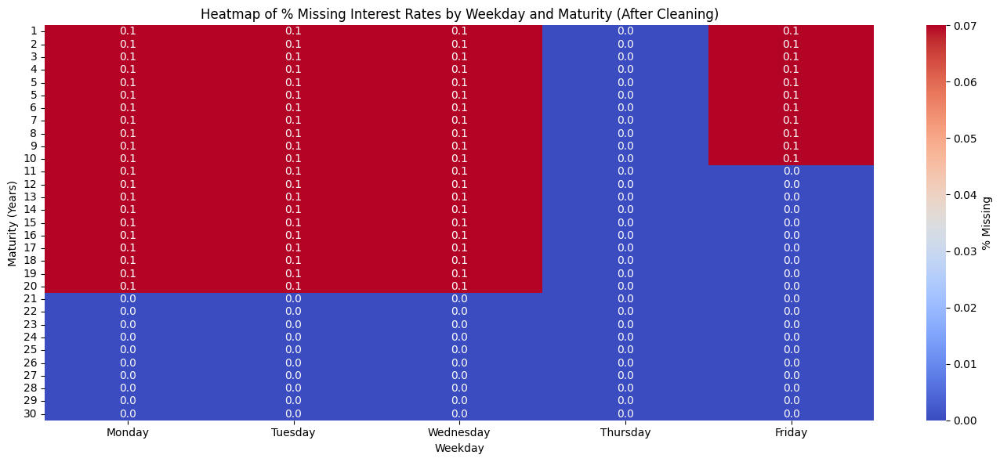


⚠ There are still missing values present — review needed.


In [ ]:
print("#-------------------------------------   DATA CLEANING - Heatmap Check On Misisng Data -------------------------------------#")

# Recompute missing values by weekday after cleaning
counts = []
percentages = []

for df in dataframes:
    file_name = df["FileReferenceName"].iloc[0]
    match = re.search(r"R(\d+)X", file_name)
    maturity = int(match.group(1)) if match else file_name

    df = df[df["Date"].notnull()].copy()
    df["Weekday"] = df["Date"].dt.strftime("%A")
    df = df[~df["Weekday"].isin(["Saturday", "Sunday"])]

    total_counts = df["Weekday"].value_counts()
    missing_counts = df[df["Interest Rate"].isnull()]["Weekday"].value_counts()

    row_percentages = {"Maturity": maturity}
    for day in ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday"]:
        total = total_counts.get(day, 0)
        missing = missing_counts.get(day, 0)
        row_percentages[day] = round((missing / total * 100), 2) if total > 0 else 0

    percentages.append(row_percentages)

# Create DataFrame
missing_percent_cleaned_df = pd.DataFrame(percentages).set_index("Maturity").sort_index()

# Plot heatmap
plt.figure(figsize=(14, 6))
sns.heatmap(missing_percent_cleaned_df, annot=True, fmt=".1f", cmap="coolwarm", cbar_kws={"label": "% Missing"})
plt.title("Heatmap of % Missing Interest Rates by Weekday and Maturity (After Cleaning)")
plt.xlabel("Weekday")
plt.ylabel("Maturity (Years)")
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

#  Print status message
if (missing_percent_cleaned_df.values == 0).all():
    print("\n Data is ready for exploration — no missing values remain.")
else:
    print("\n⚠ There are still missing values present — review needed.")


---
---
<br><br>
# **<font color='#000058'>Chapter 2: Data Exploration</font>**


### Next steps:

2. Data exploration: For each DataFrame, explore the data to understand its structure, including the number of rows and columns, data types of each column, descriptive statistics (mean, median, standard deviation, min, max) for numerical columns, and the presence of missing values. Also check for the date range covered in each file.

3. Data analysis: Analyze the relationships between different interest rates within each dataset and across datasets. Calculate correlations between different maturity rates. Look for trends and patterns in interest rate movements over time.

4. Data visualization: Create visualizations to represent the key findings. Visualize the time series of interest rates for different maturities. Show the correlation matrix between interest rates. Visualize any significant trends or patterns.

5. Finish task: Summarize the key characteristics of each dataset, highlighting any commonalities or differences across datasets. Present findings from the data exploration and analysis sections in a clear and concise manner, including the visualizations.

### **<font color='#474747'>*2.1.1 - Summary Statistics*</font>**

In [ ]:
# Assumes `dataframes` contains the cleaned datasets with columns:
# ['Date', 'Interest Rate', 'Information No IR', 'FileReferenceName', 'Maturity']

import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

# ------------------ Summary Statistics ------------------
summary_stats = []

for df in dataframes:
    maturity = df["Maturity"].iloc[0]
    clean_df = df.dropna(subset=["Interest Rate"])
    summary_stats.append({
        "Maturity": maturity,
        "Count": clean_df["Interest Rate"].count(),
        "Mean": clean_df["Interest Rate"].mean(),
        "Median": clean_df["Interest Rate"].median(),
        "Std": clean_df["Interest Rate"].std(),
        "Min": clean_df["Interest Rate"].min(),
        "Max": clean_df["Interest Rate"].max()
    })

stats_df = pd.DataFrame(summary_stats).set_index("Maturity").sort_index()
display(stats_df)


,Count,Mean,Median,Std,Min,Max
Maturity,,,,,,
0.5,7070,1.518844,1.640,1.834552,-0.98,5.12
1.0,7070,1.562951,1.790,1.843166,-0.97,5.23
2.0,7070,1.659748,1.880,1.865036,-1.02,5.32
3.0,7070,1.780074,1.990,1.886711,-1.02,5.33
4.0,7070,1.913233,2.170,1.901725,-1.00,5.35
5.0,7070,2.049522,2.320,1.909483,-0.98,5.42
6.0,7070,2.182456,2.430,1.911582,-0.95,5.48
7.0,7070,2.308267,2.480,1.910174,-0.93,5.61
8.0,7070,2.424786,2.550,1.907133,-0.91,5.73


### **<font color='#474747'>*2.1.2 - Interest Rate Trends by Maturity*</font>**

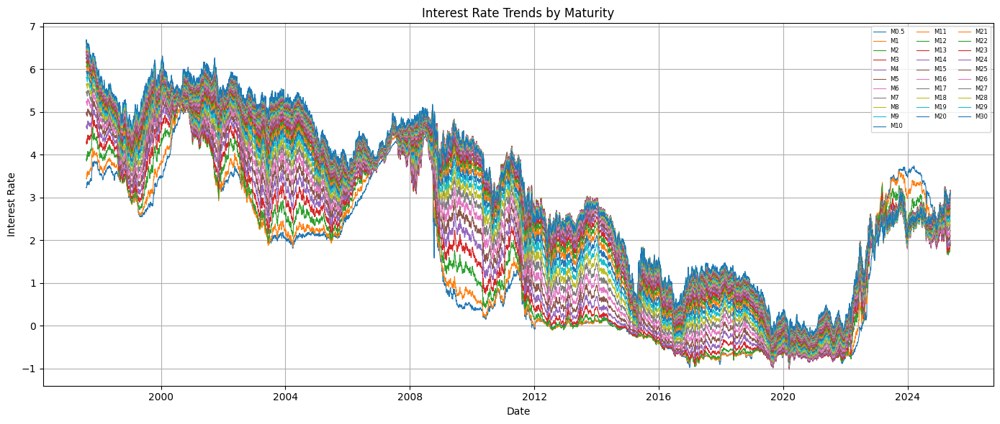

In [ ]:
plt.figure(figsize=(14, 6))
for df in dataframes:
    plt.plot(df["Date"], df["Interest Rate"], label=f'M{df["Maturity"].iloc[0]}', linewidth=0.8)

plt.title('Interest Rate Trends by Maturity')
plt.xlabel('Date')
plt.ylabel('Interest Rate')
plt.legend(loc='upper right', fontsize=6, ncol=3)
plt.grid(True)
plt.tight_layout()
plt.show()


### **<font color='#474747'>*2.1.3 - Average Interest Rate Over Time*</font>**

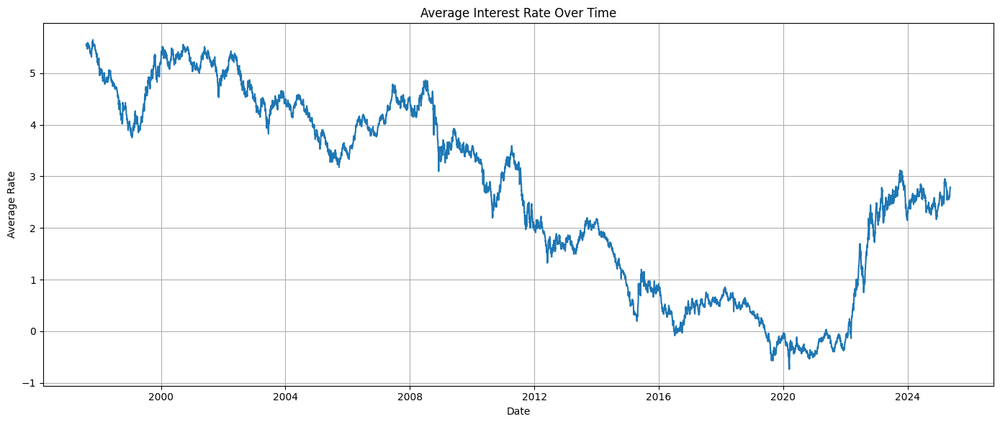

In [ ]:
combined_df = pd.concat([df.dropna(subset=["Interest Rate"]) for df in dataframes], ignore_index=True)
daily_avg = combined_df.groupby("Date")["Interest Rate"].mean().reset_index()

plt.figure(figsize=(14, 6))
plt.plot(daily_avg["Date"], daily_avg["Interest Rate"], label="Average Rate")
plt.title("Average Interest Rate Over Time")
plt.xlabel("Date")
plt.ylabel("Average Rate")
plt.grid(True)
plt.tight_layout()
plt.show()


### **<font color='#474747'>*2.1.4 - 20-Day Rolling Standard Deviation (Volatility) per Maturity*</font>**

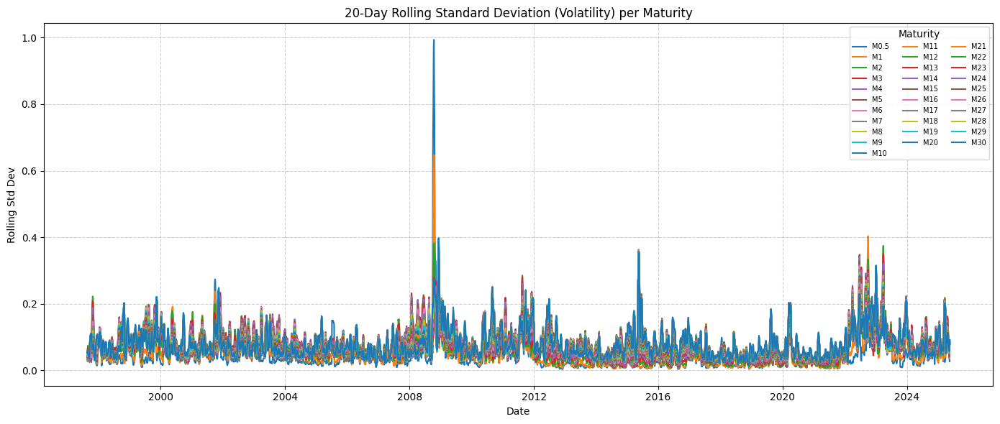

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# ----------------- Merge Cleaned DataFrames into Wide Format -----------------

# Start with an empty DataFrame
merged_df = pd.DataFrame()

# Create wide-format merged dataframe: one column per maturity
for df in dataframes:
    maturity = df["Maturity"].iloc[0]
    temp = df[["Date", "Interest Rate"]].copy()
    temp = temp.rename(columns={"Interest Rate": f"M{maturity}"})
    if merged_df.empty:
        merged_df = temp
    else:
        merged_df = pd.merge(merged_df, temp, on="Date", how="outer")

# ----------------- 20-Day Rolling Std Dev Plot -----------------

plt.figure(figsize=(14, 6))

# Plot the rolling volatility for each maturity
for col in merged_df.columns:
    if col == 'Date':
        continue
    rolling_std = merged_df[col].rolling(window=20, min_periods=10).std()
    plt.plot(merged_df['Date'], rolling_std, label=col)

plt.title("20-Day Rolling Standard Deviation (Volatility) per Maturity")
plt.xlabel("Date")
plt.ylabel("Rolling Std Dev")
plt.legend(title="Maturity", fontsize=7, ncol=3)
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

### **<font color='#474747'>*2.1.5 - 20-Day Rolling Standard Deviation (Volatility)*</font>**

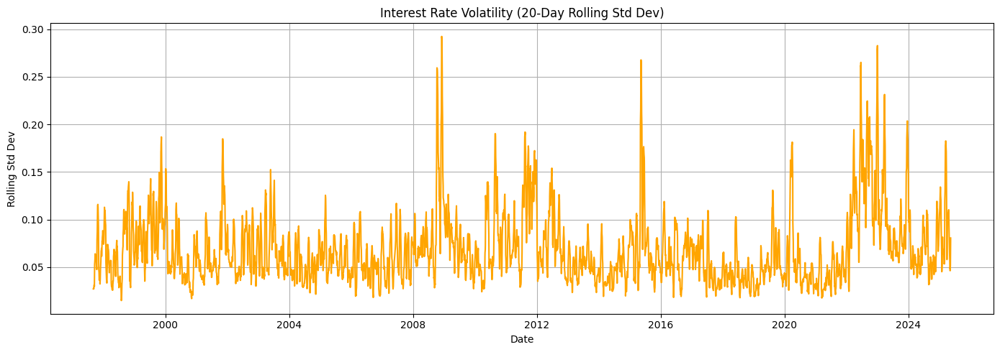

In [ ]:
daily_avg["RollingStd"] = daily_avg["Interest Rate"].rolling(window=20).std()

plt.figure(figsize=(14, 5))
plt.plot(daily_avg["Date"], daily_avg["RollingStd"], color='orange')
plt.title("20-Day Rolling Standard Deviation (Volatility)")
plt.xlabel("Date")
plt.ylabel("Rolling Std Dev")
plt.grid(True)
plt.tight_layout()
plt.show()


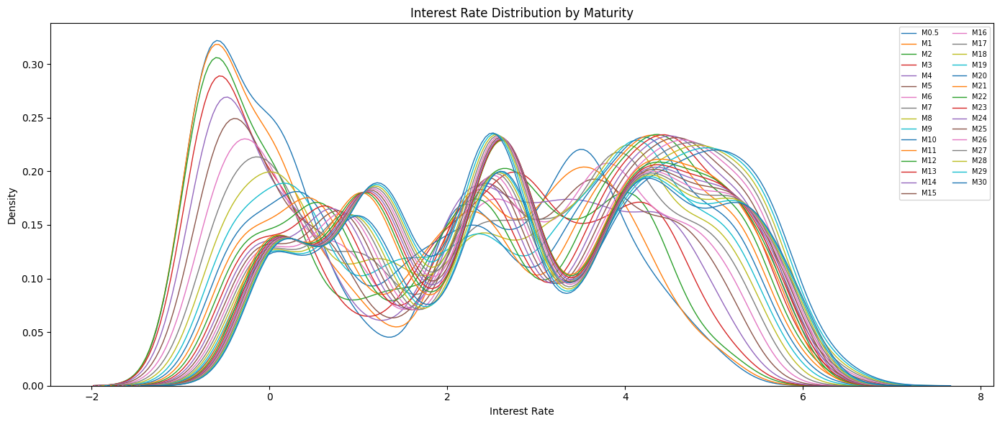

In [ ]:
plt.figure(figsize=(14, 6))
for col in merged_df.columns[1:]:
    sns.kdeplot(data=merged_df[col], label=col, linewidth=1)

plt.title("Interest Rate Distribution by Maturity")
plt.xlabel("Interest Rate")
plt.legend(fontsize=7, ncol=2)
plt.tight_layout()
plt.show()


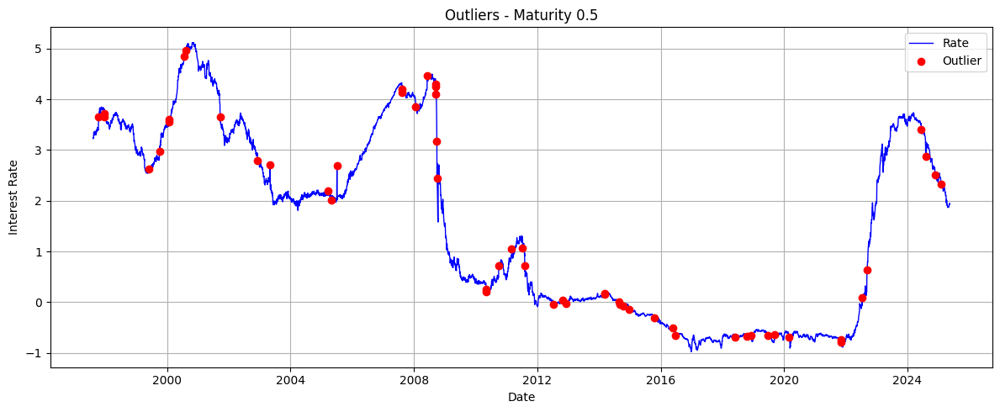

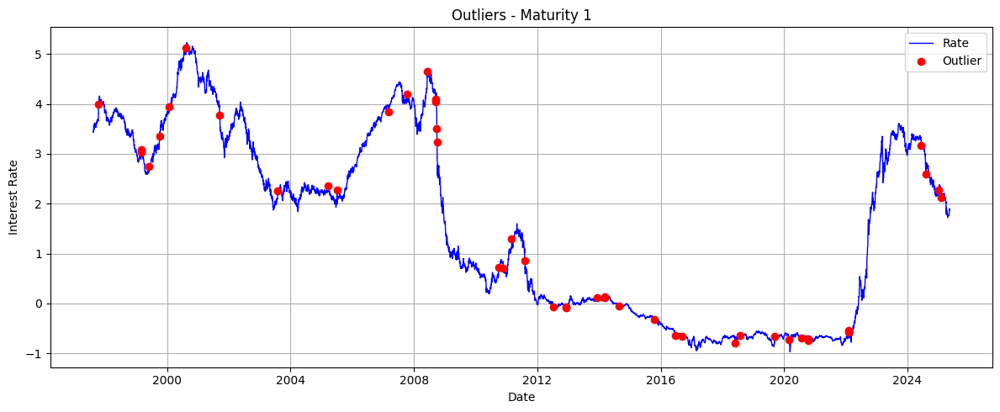

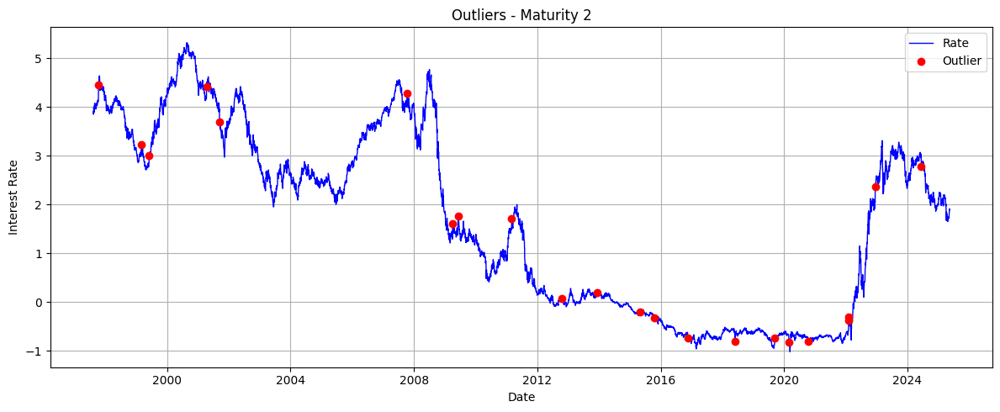

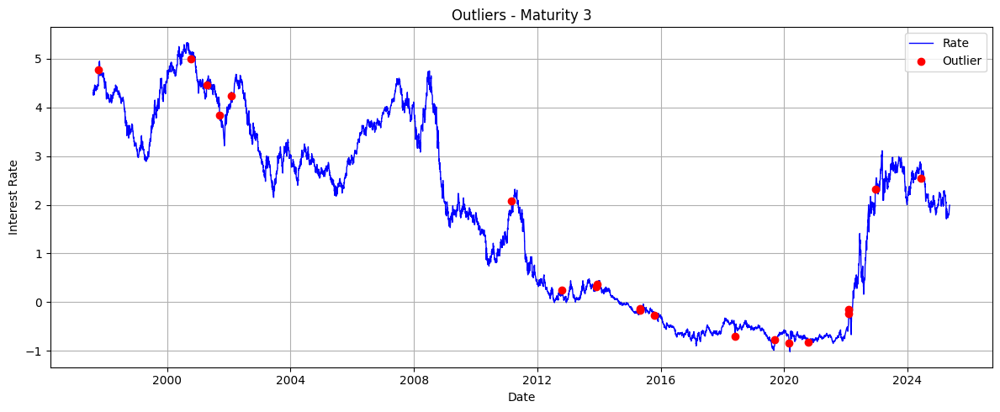

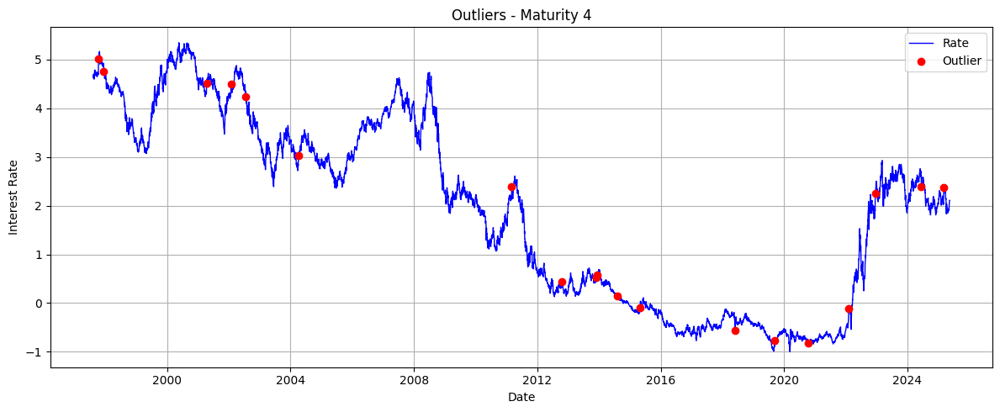

...

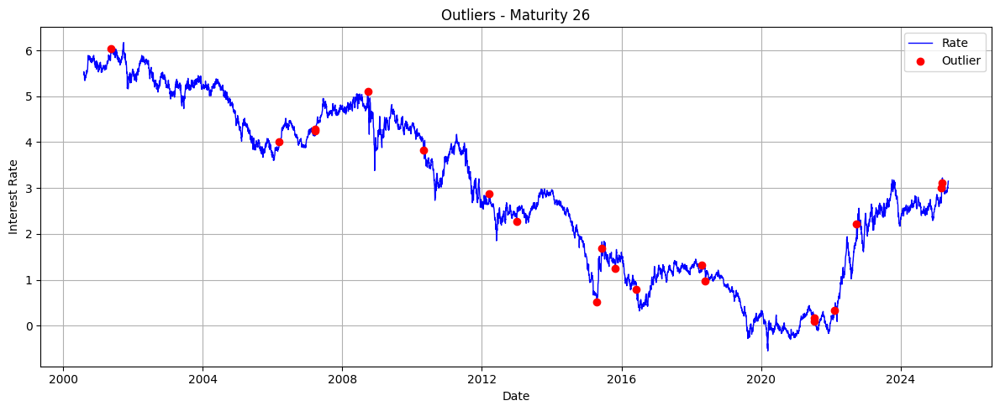

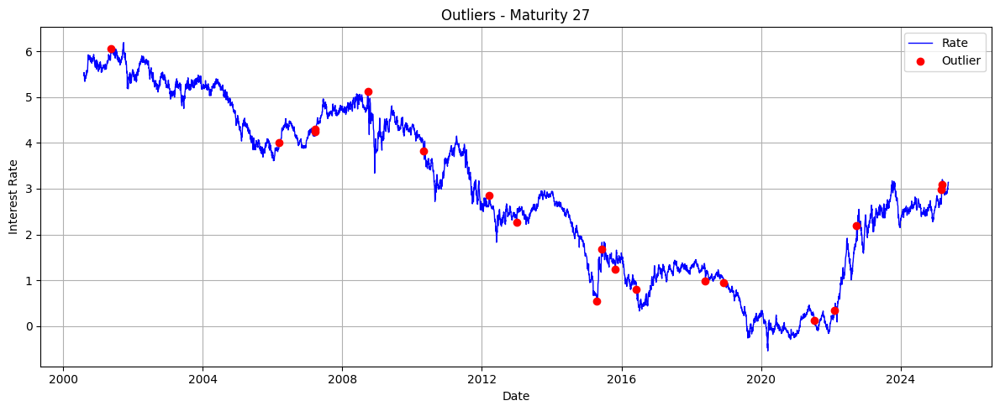

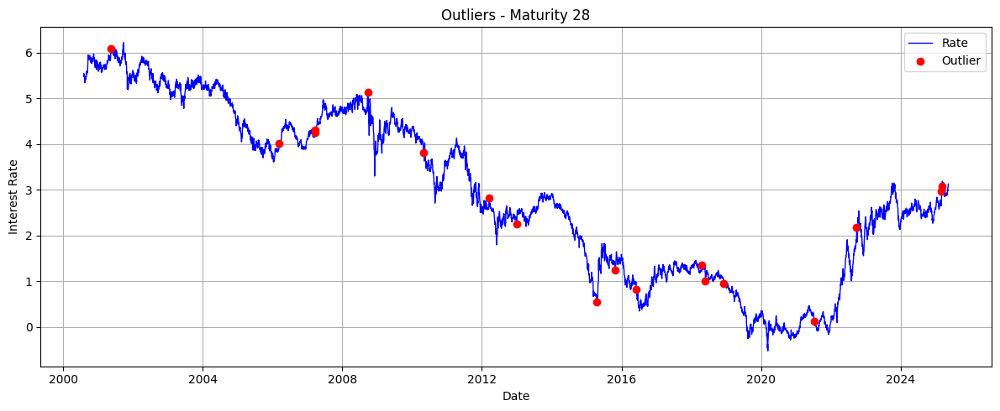

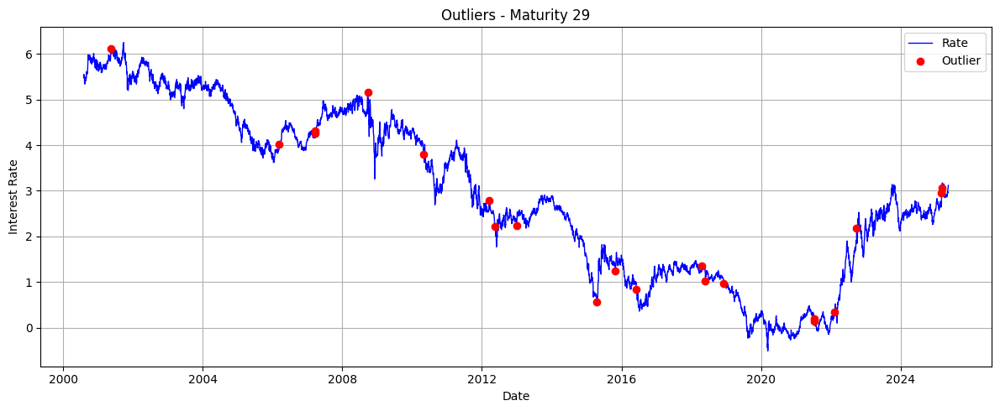

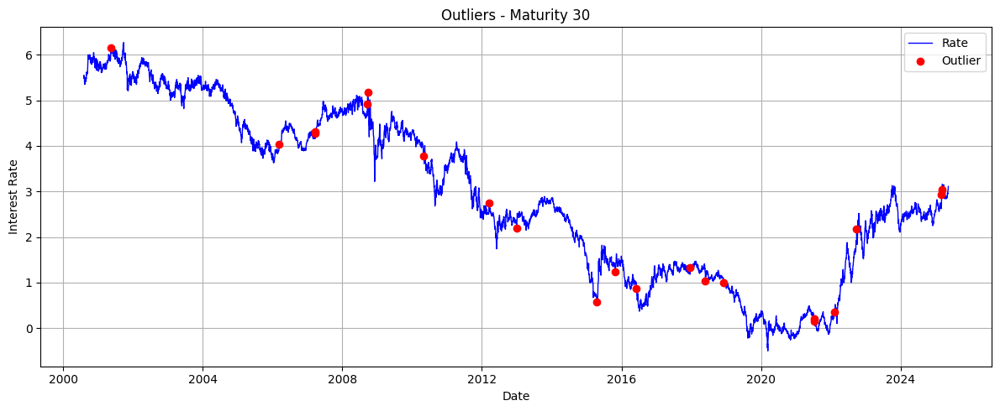

,Outlier Count,Max Outlier,Min Outlier
Maturity,,,
0.5,56,4.97,-0.79
1.0,45,5.13,-0.80
2.0,22,4.45,-0.82
3.0,20,4.99,-0.84
4.0,19,5.01,-0.83
5.0,20,5.19,-0.75
6.0,18,5.34,-0.24
7.0,19,4.68,-0.65
8.0,19,4.49,-0.60


In [ ]:
window_size = 20
z_threshold = 3
outlier_summary = []

for df in dataframes:
    df = df.copy().sort_values("Date")
    maturity = df["Maturity"].iloc[0]

    df["RollingMean"] = df["Interest Rate"].rolling(window=window_size, min_periods=10).mean()
    df["RollingStd"] = df["Interest Rate"].rolling(window=window_size, min_periods=10).std()
    df["ZScore"] = (df["Interest Rate"] - df["RollingMean"]) / df["RollingStd"]
    df["Outlier"] = df["ZScore"].abs() > z_threshold

    outliers = df[df["Outlier"]]

    plt.figure(figsize=(12, 5))
    plt.plot(df["Date"], df["Interest Rate"], label="Rate", color="blue", linewidth=1)
    plt.scatter(outliers["Date"], outliers["Interest Rate"], color="red", label="Outlier", zorder=5)
    plt.title(f'Outliers - Maturity {maturity}')
    plt.xlabel("Date")
    plt.ylabel("Interest Rate")
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()

    outlier_summary.append({
        "Maturity": maturity,
        "Outlier Count": len(outliers),
        "Max Outlier": outliers["Interest Rate"].max(),
        "Min Outlier": outliers["Interest Rate"].min()
    })

outlier_df = pd.DataFrame(outlier_summary).set_index("Maturity").sort_index()
display(outlier_df)



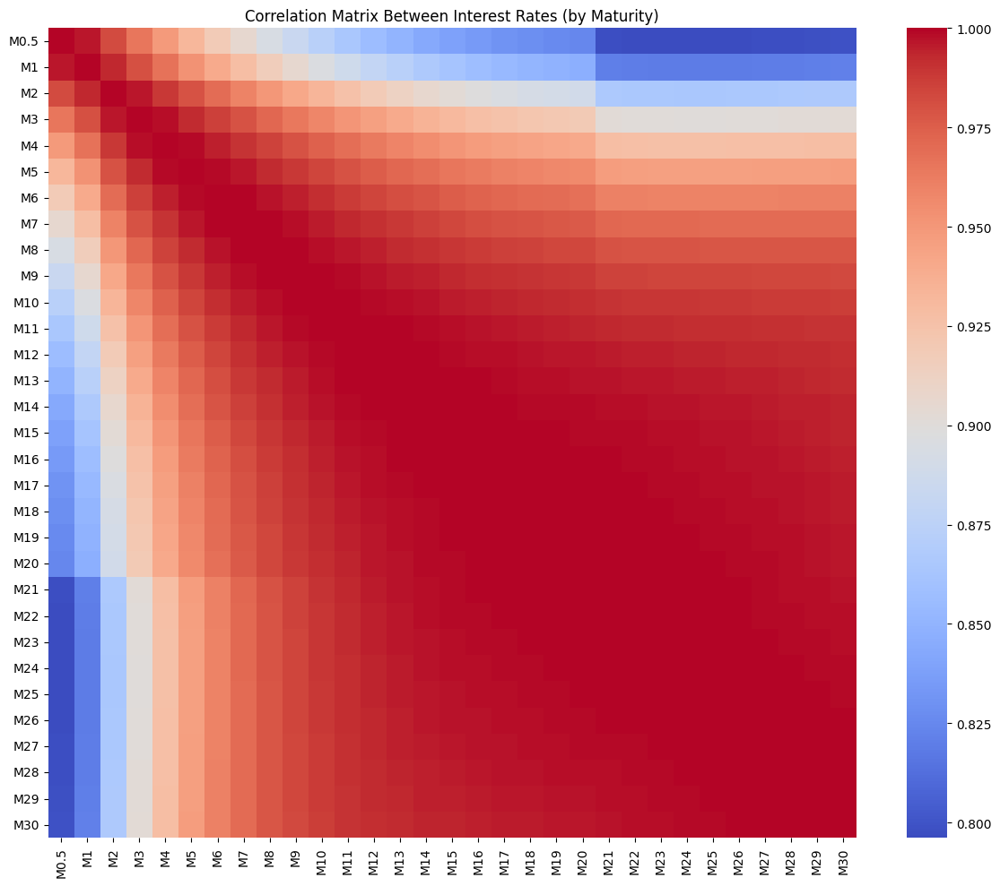

In [ ]:
# Create merged wide format DataFrame
merged_df = pd.DataFrame()
for df in dataframes:
    maturity = df["Maturity"].iloc[0]
    temp = df[["Date", "Interest Rate"]].rename(columns={"Interest Rate": f"M{maturity}"})
    merged_df = temp if merged_df.empty else pd.merge(merged_df, temp, on="Date", how="outer")

# Drop date for correlation matrix
correlation_matrix = merged_df.drop(columns="Date").corr()

plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, cmap="coolwarm", annot=False)
plt.title("Correlation Matrix Between Interest Rates (by Maturity)")
plt.tight_layout()
plt.show()


# EGON DRAFT TESTS

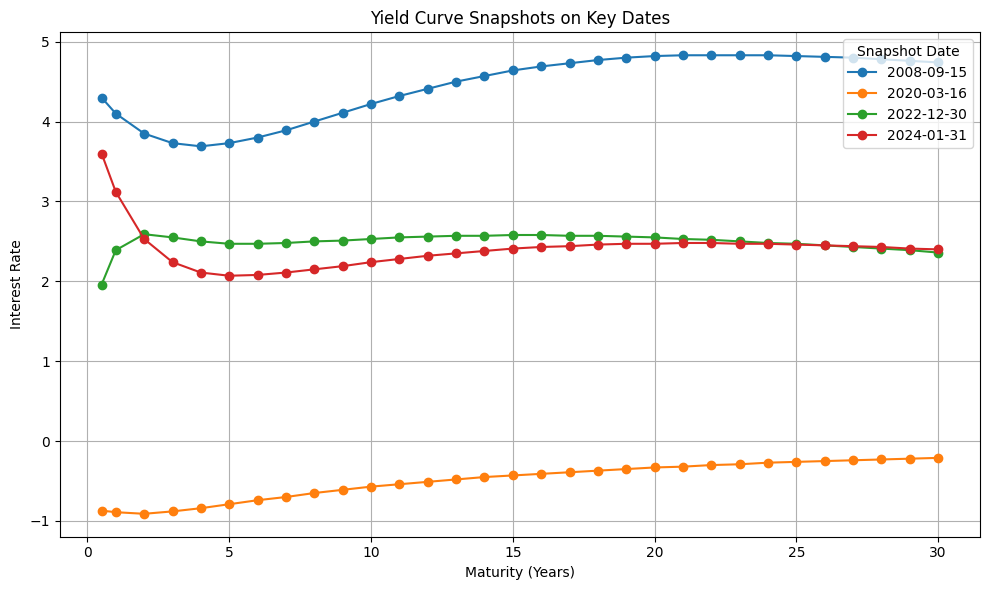

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

# 1. Select snapshot dates
snapshot_dates = ['2008-09-15', '2020-03-16', '2022-12-30', '2024-01-31']
snapshot_dates = pd.to_datetime(snapshot_dates)

# 2. Extract yield curves for each date
curve_data = {}

for date in snapshot_dates:
    row = merged_df[merged_df['Date'] == date]
    if not row.empty:
        rates = row.drop(columns='Date').iloc[0]
        maturities = [float(col[1:]) for col in rates.index]  # strip 'M' and convert to float
        curve_data[date.strftime('%Y-%m-%d')] = pd.Series(rates.values, index=maturities)

# 3. Plot yield curves
plt.figure(figsize=(10, 6))
for label, series in curve_data.items():
    plt.plot(series.index, series.values, marker='o', label=label)

plt.title("Yield Curve Snapshots on Key Dates")
plt.xlabel("Maturity (Years)")
plt.ylabel("Interest Rate")
plt.legend(title="Snapshot Date")
plt.grid(True)
plt.tight_layout()
plt.show()

2008-09-15: Likely steep yield curve (low short rates, higher long rates).

2020-03-16: Extremely low rates across maturities (flight to safety).

2022-12-30: Curve may flatten or invert due to ECB hikes.

2024-12-31: Most recent economic sentiment — potentially reflation or normalization.

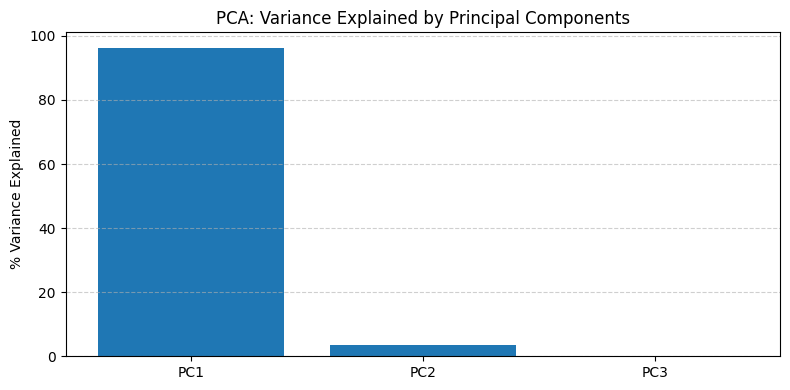

In [ ]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Prepare PCA-ready data (drop missing rows)
pca_df = merged_df.dropna().copy()

# 2. Extract only the maturity columns
maturity_cols = [col for col in pca_df.columns if col != 'Date']
X = pca_df[maturity_cols].values

# 3. Standardize (mean 0, std 1)
X_scaled = StandardScaler().fit_transform(X)

# 4. Run PCA
pca = PCA(n_components=3)
principal_components = pca.fit_transform(X_scaled)

# 5. Plot explained variance
plt.figure(figsize=(8, 4))
explained = pca.explained_variance_ratio_ * 100
plt.bar(range(1, 4), explained, tick_label=["PC1", "PC2", "PC3"])
plt.title("PCA: Variance Explained by Principal Components")
plt.ylabel("% Variance Explained")
plt.grid(True, axis='y', linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()


What You Should See

- PC1 usually explains >90% — it's the parallel shift in the curve (level).

- PC2 adds 5–8% — interpretable as steepening/flattening.

- PC3 is smaller — often curvature effects.

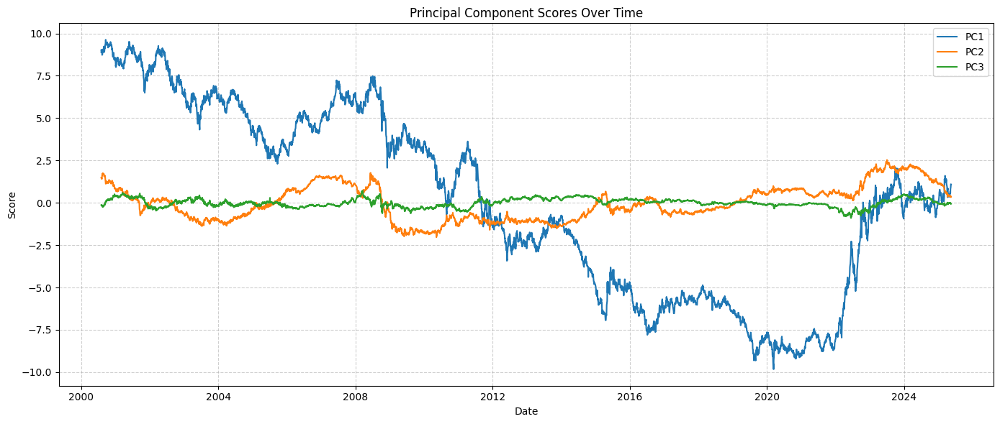

In [ ]:
# Create DataFrame with component scores and dates
pca_scores_df = pd.DataFrame(principal_components, columns=["PC1", "PC2", "PC3"])
pca_scores_df["Date"] = pca_df["Date"].values

# Plot PC1 (level), PC2 (slope), PC3 (curvature) over time
plt.figure(figsize=(14, 6))
for i, pc in enumerate(["PC1", "PC2", "PC3"], 1):
    plt.plot(pca_scores_df["Date"], pca_scores_df[pc], label=pc)

plt.title("Principal Component Scores Over Time")
plt.xlabel("Date")
plt.ylabel("Score")
plt.legend()
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()


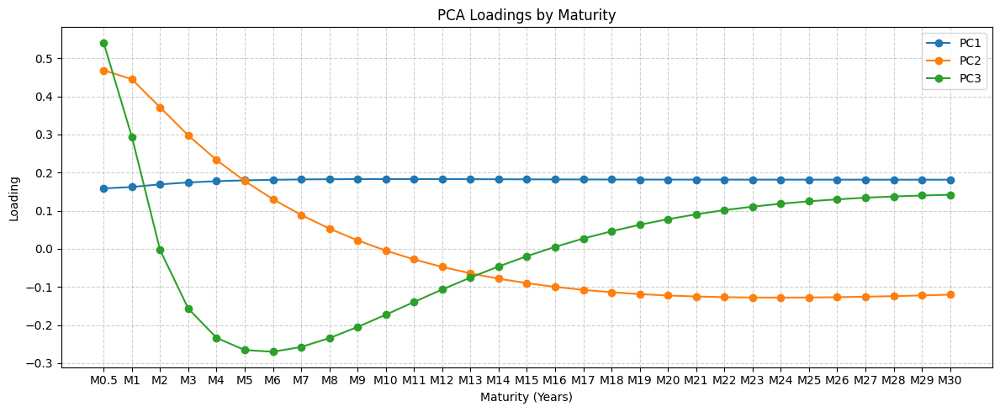

In [ ]:
# Loadings: influence of each maturity on each component
loadings = pd.DataFrame(pca.components_.T, index=maturity_cols, columns=["PC1", "PC2", "PC3"])

# Plot each component
plt.figure(figsize=(12, 5))
for i, pc in enumerate(["PC1", "PC2", "PC3"], 1):
    plt.plot(loadings.index, loadings[pc], marker='o', label=pc)

plt.title("PCA Loadings by Maturity")
plt.xlabel("Maturity (Years)")
plt.ylabel("Loading")
plt.legend()
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()


PC1 loadings all same sign → parallel shift

PC2 loadings change sign → slope (short vs. long)

PC3 has 3 sign changes → curvature (hump/dip)

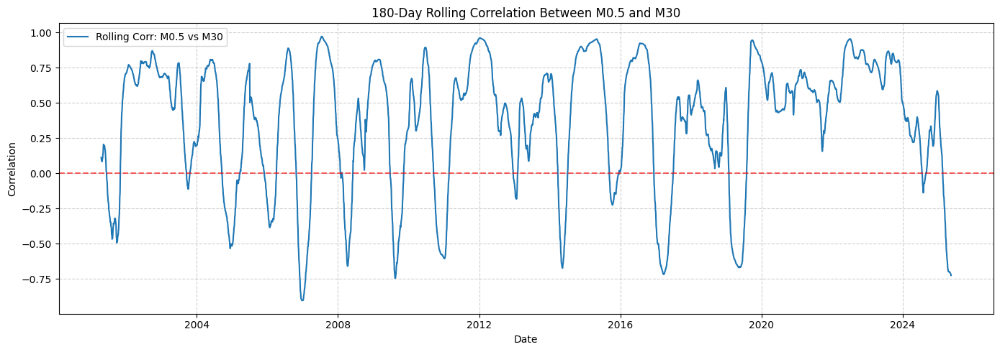

In [ ]:
# Pick two maturities to compare
short_col = "M0.5"
long_col = "M30"  # Change to M30.0 if preferred

# Drop rows where either is missing
pair_df = merged_df[["Date", short_col, long_col]].dropna().copy()

# Set rolling window size
window = 180  # roughly 6 months

# Calculate rolling correlation
rolling_corr = pair_df[short_col].rolling(window).corr(pair_df[long_col])

# Plot
plt.figure(figsize=(14, 5))
plt.plot(pair_df["Date"], rolling_corr, label=f"Rolling Corr: {short_col} vs {long_col}")
plt.axhline(0, color='red', linestyle='--', alpha=0.6)
plt.title(f"{window}-Day Rolling Correlation Between {short_col} and {long_col}")
plt.xlabel("Date")
plt.ylabel("Correlation")
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.legend()
plt.show()

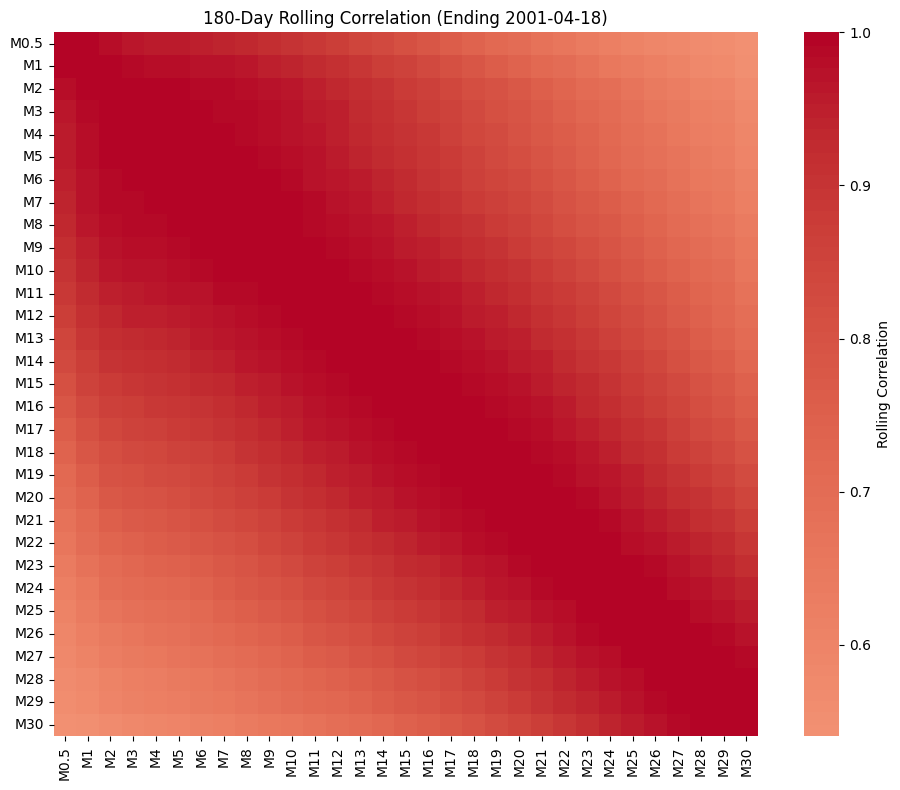

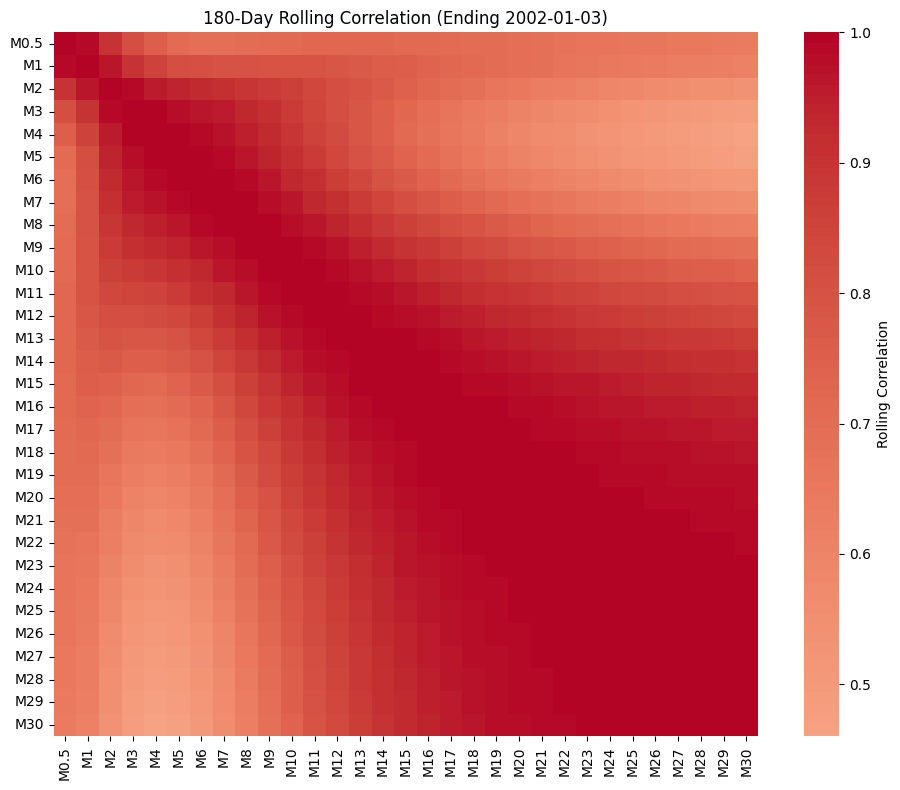

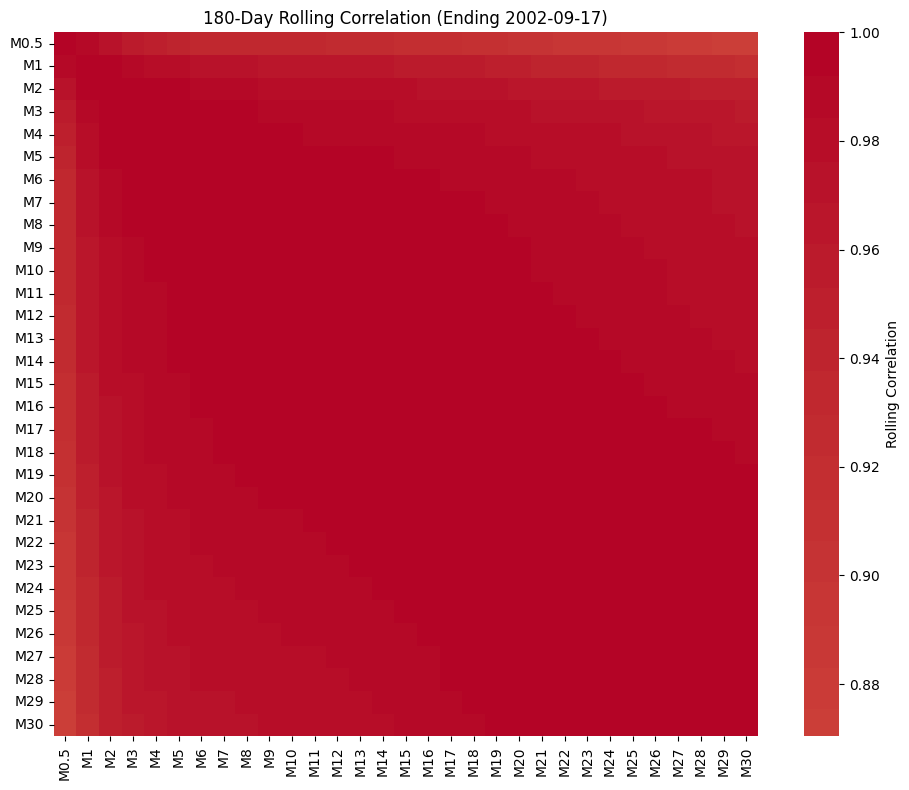

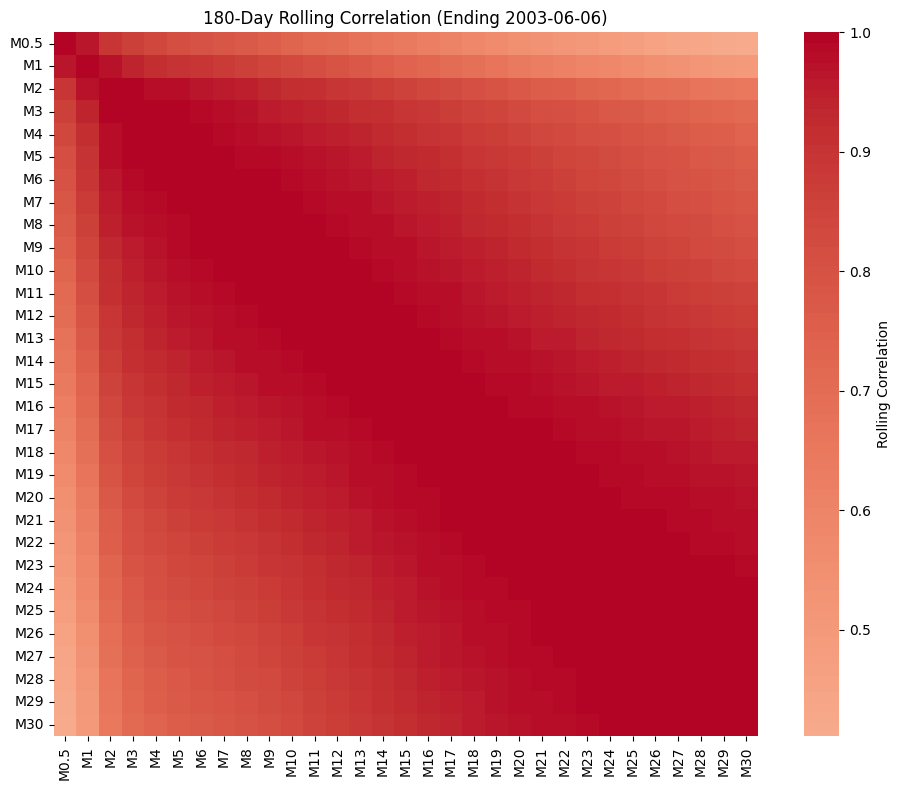

In [ ]:
import itertools
import matplotlib.pyplot as plt
import seaborn as sns

# Step 1: Ensure consistent maturity column names (e.g., 'M0.5', 'M10.0')
merged_df = merged_df.rename(columns={
    col: f"{col}" if col.startswith("M") and "." not in col else col
    for col in merged_df.columns if col != 'Date'
})

# Step 2: Filter usable maturity columns
maturity_cols = [col for col in merged_df.columns if col.startswith('M')]
rolling_corr_window = 180  # ~6 months

# Step 3: Prepare rolling correlation matrix storage
rolling_corr_matrices = []

# Step 4: Drop rows with any missing values in maturity columns
rolling_df = merged_df[['Date'] + maturity_cols].dropna().copy()
rolling_df.set_index('Date', inplace=True)

# Step 5: Compute rolling correlations at fixed intervals (e.g., yearly snapshots)
date_index = rolling_df.index
snapshots = date_index[::180]  # every 180th day (approx yearly)

for snap_date in snapshots:
    end_date = snap_date
    start_date = end_date - pd.Timedelta(days=rolling_corr_window)

    window_df = rolling_df.loc[start_date:end_date]
    if len(window_df) < 30:  # Skip if too few data points
        continue

    corr_matrix = window_df.corr()
    rolling_corr_matrices.append((end_date.strftime("%Y-%m-%d"), corr_matrix))

# Step 6: Plot a few key rolling correlation heatmaps
for date_label, matrix in rolling_corr_matrices[:4]:  # plot first 4
    plt.figure(figsize=(10, 8))
    sns.heatmap(matrix, cmap="coolwarm", center=0, annot=False, square=True,
                cbar_kws={"label": "Rolling Correlation"})
    plt.title(f"{rolling_corr_window}-Day Rolling Correlation (Ending {date_label})")
    plt.tight_layout()
    plt.show()


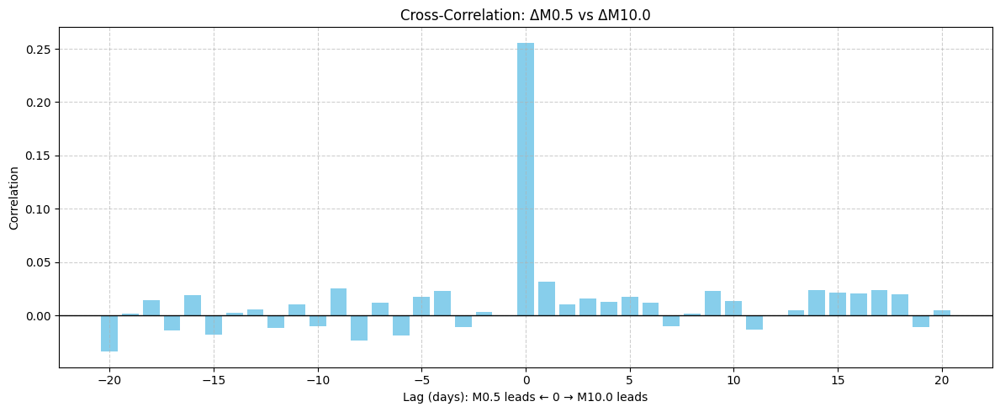

In [ ]:
from statsmodels.tsa.stattools import ccf
import numpy as np

# Prepare time-aligned and detrended data
lead_lag_df = merged_df[["Date", "M0.5", "M10"]].dropna().copy()
short_rates = lead_lag_df["M0.5"].diff().dropna()
long_rates = lead_lag_df["M10"].diff().dropna()

# Align lengths
min_len = min(len(short_rates), len(long_rates))
short_rates = short_rates[-min_len:]
long_rates = long_rates[-min_len:]

# Compute cross-correlation (lags from -20 to +20)
max_lag = 20
lags = np.arange(-max_lag, max_lag + 1)
cc_values = [short_rates.shift(-lag).corr(long_rates) for lag in lags]

# Plot
plt.figure(figsize=(12, 5))
plt.bar(lags, cc_values, width=0.8, color='skyblue')
plt.axhline(0, color='black', linewidth=1)
plt.title("Cross-Correlation: ΔM0.5 vs ΔM10.0")
plt.xlabel("Lag (days): M0.5 leads ← 0 → M10.0 leads")
plt.ylabel("Correlation")
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

In [ ]:
from statsmodels.tsa.stattools import grangercausalitytests

# Prepare the same differenced data
gc_df = lead_lag_df[["M0.5", "M10"]].dropna().diff().dropna()

# Test if M0.5 helps predict M10.0
print("M0.5 → M10.0")
grangercausalitytests(gc_df[["M10", "M0.5"]], maxlag=5, verbose=True)

# Test if M10.0 helps predict M0.5
print("\nM10.0 → M0.5")
grangercausalitytests(gc_df[["M0.5", "M10"]], maxlag=5, verbose=True)

M0.5 → M10.0

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.2768  , p=0.2585  , df_denom=7065, df_num=1
ssr based chi2 test:   chi2=1.2773  , p=0.2584  , df=1
likelihood ratio test: chi2=1.2772  , p=0.2584  , df=1
parameter F test:         F=1.2768  , p=0.2585  , df_denom=7065, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.6457  , p=0.5243  , df_denom=7062, df_num=2
ssr based chi2 test:   chi2=1.2924  , p=0.5240  , df=2
likelihood ratio test: chi2=1.2923  , p=0.5241  , df=2
parameter F test:         F=0.6457  , p=0.5243  , df_denom=7062, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=0.6166  , p=0.6042  , df_denom=7059, df_num=3
ssr based chi2 test:   chi2=1.8517  , p=0.6038  , df=3
likelihood ratio test: chi2=1.8515  , p=0.6038  , df=3
parameter F test:         F=0.6166  , p=0.6042  , df_denom=7059, df_num=3

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=1

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(


{np.int64(1): ({'ssr_ftest': (np.float64(14.134079599542712),
    np.float64(0.00017160523289051646),
    np.float64(7065.0),
    np.int64(1)),
   'ssr_chi2test': (np.float64(14.140081331856745),
    np.float64(0.0001696893932059326),
    np.int64(1)),
   'lrtest': (np.float64(14.125956004078034),
    np.float64(0.00017096832141846744),
    np.int64(1)),
   'params_ftest': (np.float64(14.134079599539488),
    np.float64(0.0001716052328908707),
    np.float64(7065.0),
    1.0)},
   array([[0., 1., 0.]])]),
 np.int64(2): ({'ssr_ftest': (np.float64(6.9979493716163015),
    np.float64(0.0009201038255155292),
    np.float64(7062.0),
    np.int64(2)),
   'ssr_chi2test': (np.float64(14.005808045656302),
    np.float64(0.0009092376808998147),
    np.int64(2)),
   'lrtest': (np.float64(13.991947576876555),
    np.float64(0.0009155607961727402),
    np.int64(2)),
   'params_ftest': (np.float64(6.997949371611716),
    np.float64(0.0009201038255195131),
    np.float64(7062.0),
    2.0)},
   array(

In [ ]:
from statsmodels.tsa.stattools import adfuller

def adf_test(series, label):
    result = adfuller(series.dropna())
    print(f"ADF Test for {label}")
    print(f"  Test Statistic: {result[0]:.4f}")
    print(f"  p-value: {result[1]:.4f}")
    print(f"  Stationary? {'Yes' if result[1] < 0.05 else 'No'}\n")

# Run for selected maturities
for maturity in ["M0.5", "M5", "M10", "M30"]:
    series = merged_df[maturity]
    adf_test(series, maturity)

ADF Test for M0.5
  Test Statistic: -1.5393
  p-value: 0.5140
  Stationary? No

ADF Test for M5
  Test Statistic: -1.5865
  p-value: 0.4904
  Stationary? No

ADF Test for M10
  Test Statistic: -1.7659
  p-value: 0.3975
  Stationary? No

ADF Test for M30
  Test Statistic: -1.4591
  p-value: 0.5536
  Stationary? No



In [ ]:
def hurst_exponent(ts):
    lags = range(2, 100)
    tau = [np.sqrt(np.std(np.subtract(ts[lag:], ts[:-lag]))) for lag in lags]
    hurst, _ = np.polyfit(np.log(lags), np.log(tau), 1)
    return hurst

print("Hurst Exponent:")
for maturity in ["M0.5", "M5", "M10", "M30"]:
    h = hurst_exponent(merged_df[maturity].dropna().values)
    desc = (
        "Mean-Reverting (<0.5)" if h < 0.5 else
        "Random Walk (~0.5)" if np.isclose(h, 0.5, atol=0.05) else
        "Trending (>0.5)"
    )
    print(f"  {maturity}: H = {h:.4f} → {desc}")

Hurst Exponent:
  M0.5: H = 0.3295 → Mean-Reverting (<0.5)
  M5: H = 0.2630 → Mean-Reverting (<0.5)
  M10: H = 0.2472 → Mean-Reverting (<0.5)
  M30: H = 0.2244 → Mean-Reverting (<0.5)


In [ ]:
import statsmodels.api as sm

print("\nAR(1) Coefficients:")
for maturity in ["M0.5", "M5", "M10", "M30"]:
    ts = merged_df[maturity].dropna()
    ts_diff = ts.diff().dropna()
    ts_lag = ts.shift(1).dropna().reindex(ts_diff.index)
    model = sm.OLS(ts_diff, sm.add_constant(ts_lag)).fit()
    coef = model.params[1]
    print(f"  {maturity}: AR(1) coef = {coef:.4f} {'← stronger mean reversion' if coef < 0 else ''}")


AR(1) Coefficients:
  M0.5: AR(1) coef = -0.0002 ← stronger mean reversion
  M5: AR(1) coef = -0.0005 ← stronger mean reversion
  M10: AR(1) coef = -0.0005 ← stronger mean reversion
  M30: AR(1) coef = -0.0006 ← stronger mean reversion


<ipython-input-183-edd2e50ba9b1>:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = model.params[1]
<ipython-input-183-edd2e50ba9b1>:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = model.params[1]
<ipython-input-183-edd2e50ba9b1>:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef = model.params[1]
<ipython-input-183-edd2e50ba9b1>:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a futu

| Metric           | What to Look For             |
| ---------------- | ---------------------------- |
| **ADF p < 0.05** | Stationary (mean-reverting)  |
| **Hurst < 0.5**  | Mean-reverting               |
| **AR(1) < 0**    | Pull back toward equilibrium |

                     Constant Mean - GARCH Model Results                      
Dep. Variable:                   M0.5   R-squared:                       0.000
Mean Model:             Constant Mean   Adj. R-squared:                  0.000
Vol Model:                      GARCH   Log-Likelihood:               -16328.0
Distribution:                  Normal   AIC:                           32664.0
Method:            Maximum Likelihood   BIC:                           32691.4
                                        No. Observations:                 7069
Date:                Thu, May 29 2025   Df Residuals:                     7068
Time:                        13:51:33   Df Model:                            1
                                  Mean Model                                 
                 coef    std err          t      P>|t|       95.0% Conf. Int.
-----------------------------------------------------------------------------
mu         7.4242e-03  4.505e-02      0.165      0.869 

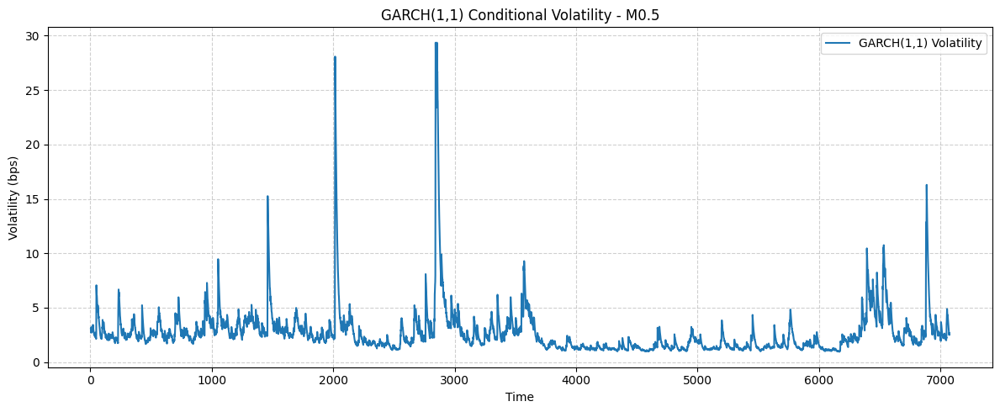

In [ ]:
!pip install arch

from arch import arch_model
import matplotlib.pyplot as plt

# Use short-end rates as an example
maturity = "M0.5"
series = merged_df[maturity].dropna()
returns = series.diff().dropna() * 100  # convert to basis points for stability

# Fit GARCH(1,1)
model = arch_model(returns, vol='Garch', p=1, q=1)
garch_fit = model.fit(disp='off')

# Summary
print(garch_fit.summary())

# Plot conditional volatility
plt.figure(figsize=(12, 5))
plt.plot(garch_fit.conditional_volatility, label='GARCH(1,1) Volatility')
plt.title(f"GARCH(1,1) Conditional Volatility - {maturity}")
plt.xlabel("Time")
plt.ylabel("Volatility (bps)")
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.legend()
plt.show()

Interpretation:
Significant α (ARCH) → short-term shocks affect volatility.

Significant β (GARCH) → volatility persistence (clustering).

High α + β (close to 1) → long memory in volatility.


====== GARCH(1,1) Analysis for M10 ======
                     Constant Mean - GARCH Model Results                      
Dep. Variable:                    M10   R-squared:                       0.000
Mean Model:             Constant Mean   Adj. R-squared:                  0.000
Vol Model:                      GARCH   Log-Likelihood:               -20600.2
Distribution:                  Normal   AIC:                           41208.4
Method:            Maximum Likelihood   BIC:                           41235.8
                                        No. Observations:                 7069
Date:                Thu, May 29 2025   Df Residuals:                     7068
Time:                        13:51:34   Df Model:                            1
                                Mean Model                                
                 coef    std err          t      P>|t|    95.0% Conf. Int.
--------------------------------------------------------------------------
mu            -0.0652

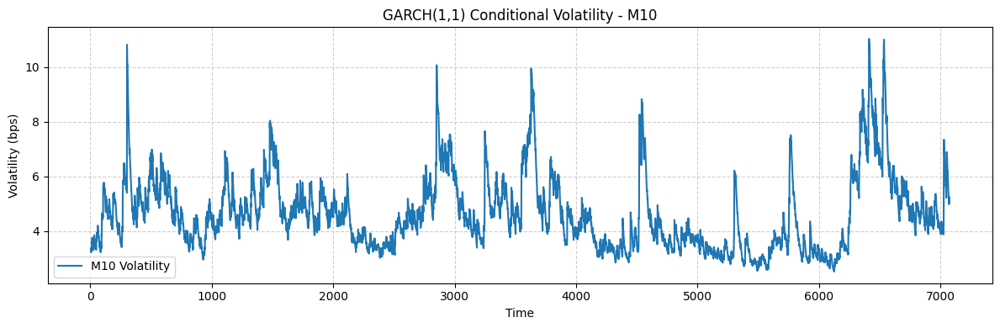


====== GARCH(1,1) Analysis for M30 ======
                     Constant Mean - GARCH Model Results                      
Dep. Variable:                    M30   R-squared:                       0.000
Mean Model:             Constant Mean   Adj. R-squared:                  0.000
Vol Model:                      GARCH   Log-Likelihood:               -18904.0
Distribution:                  Normal   AIC:                           37816.0
Method:            Maximum Likelihood   BIC:                           37843.0
                                        No. Observations:                 6309
Date:                Thu, May 29 2025   Df Residuals:                     6308
Time:                        13:51:34   Df Model:                            1
                                Mean Model                                
                 coef    std err          t      P>|t|    95.0% Conf. Int.
--------------------------------------------------------------------------
mu            -0.0356

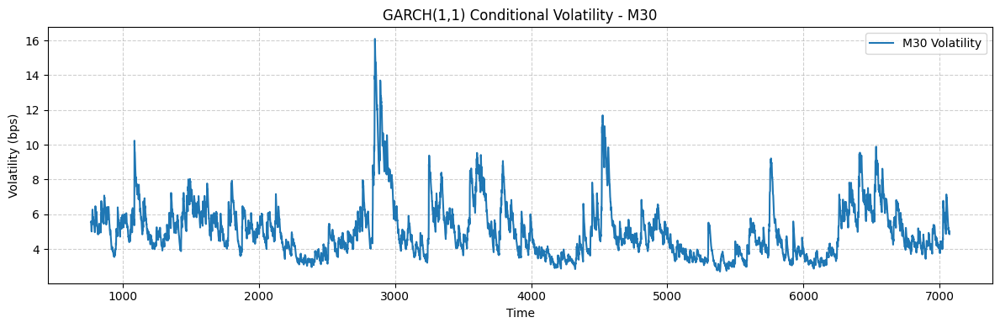

In [ ]:
from arch import arch_model
import matplotlib.pyplot as plt

# Define maturities to test
for maturity in ["M10", "M30"]:
    print(f"\n====== GARCH(1,1) Analysis for {maturity} ======")

    # Get cleaned returns in basis points
    series = merged_df[maturity].dropna()
    returns = series.diff().dropna() * 100  # use bps for stability

    # Fit GARCH(1,1)
    model = arch_model(returns, vol='Garch', p=1, q=1)
    garch_fit = model.fit(disp='off')

    # Summary of results
    print(garch_fit.summary())

    # Plot conditional volatility
    plt.figure(figsize=(12, 4))
    plt.plot(garch_fit.conditional_volatility, label=f'{maturity} Volatility')
    plt.title(f"GARCH(1,1) Conditional Volatility - {maturity}")
    plt.xlabel("Time")
    plt.ylabel("Volatility (bps)")
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.legend()
    plt.tight_layout()
    plt.show()


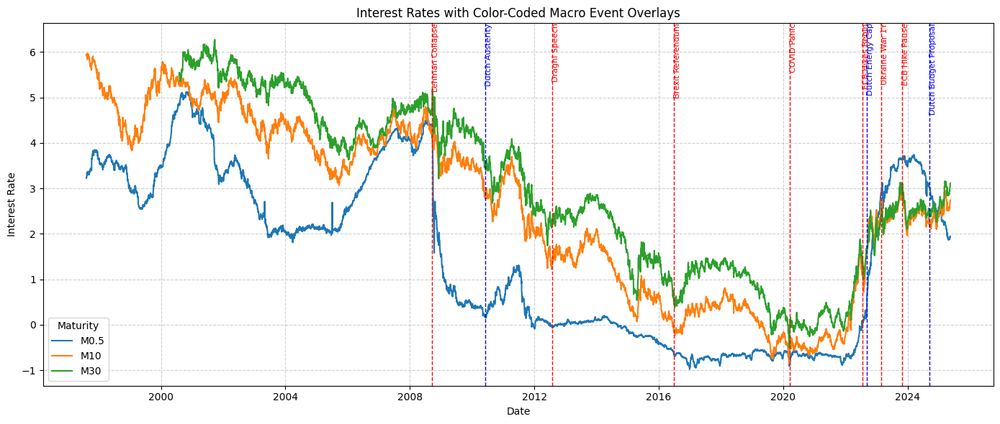

In [ ]:
# Define categorized events
event_dict = {
    "global": {
        "Lehman Collapse": "2008-09-15",
        "Draghi Speech": "2012-07-26",
        "Brexit Referendum": "2016-06-24",
        "COVID Panic": "2020-03-16",
        "ECB Hikes Begin": "2022-07-21",
        "Ukraine War 1Y": "2023-02-24",
        "ECB Hike Pause": "2023-10-26"
    },
    "dutch": {
        "Dutch Austerity": "2010-06-01",
        "Dutch Energy Cap": "2022-09-06",
        "Dutch Budget Proposal": "2024-09-15"
    }
}

# Plot selected maturities
plt.figure(figsize=(14, 6))
for mat in ["M0.5", "M10", "M30"]:
    plt.plot(merged_df["Date"], merged_df[mat], label=mat)

# Plot global events (red)
for label, date in event_dict["global"].items():
    date_obj = pd.to_datetime(date)
    plt.axvline(date_obj, color='red', linestyle='--', linewidth=1)
    plt.text(date_obj, plt.ylim()[1], label, rotation=90,
             verticalalignment='top', fontsize=8, color='red')

# Plot Dutch events (blue)
for label, date in event_dict["dutch"].items():
    date_obj = pd.to_datetime(date)
    plt.axvline(date_obj, color='blue', linestyle='--', linewidth=1)
    plt.text(date_obj, plt.ylim()[1], label, rotation=90,
             verticalalignment='top', fontsize=8, color='blue')

plt.title("Interest Rates with Color-Coded Macro Event Overlays")
plt.xlabel("Date")
plt.ylabel("Interest Rate")
plt.legend(title="Maturity")
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

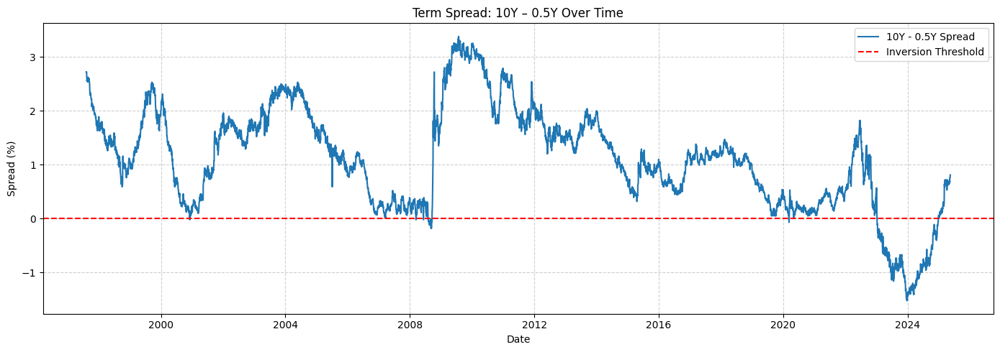

In [ ]:
# Compute 10Y – 0.5Y spread
merged_df["TermSpread_10Y_0.5Y"] = merged_df["M10"] - merged_df["M0.5"]

# Plot the spread
plt.figure(figsize=(14, 5))
plt.plot(merged_df["Date"], merged_df["TermSpread_10Y_0.5Y"], label="10Y - 0.5Y Spread")
plt.axhline(0, color='red', linestyle='--', label="Inversion Threshold")
plt.title("Term Spread: 10Y – 0.5Y Over Time")
plt.xlabel("Date")
plt.ylabel("Spread (%)")
plt.grid(True, linestyle='--', alpha=0.6)
plt.legend()
plt.tight_layout()
plt.show()

In [ ]:
# Compare mean and std for selected maturities
summary = []
for mat in ["M0.5", "M5", "M10"]:
    raw_mean = merged_df[mat].mean()
    interp_mean = interpolated_df[mat].mean()
    raw_std = merged_df[mat].std()
    interp_std = interpolated_df[mat].std()
    summary.append((mat, raw_mean, interp_mean, raw_std, interp_std))

# Create DataFrame
summary_df = pd.DataFrame(summary, columns=[
    "Maturity", "Raw Mean", "Interpolated Mean", "Raw Std", "Interpolated Std"
])

# Display results
print("\n📊 Missing Data Impact Summary:\n")
print(summary_df.round(4))

NameError: name 'interpolated_df' is not defined

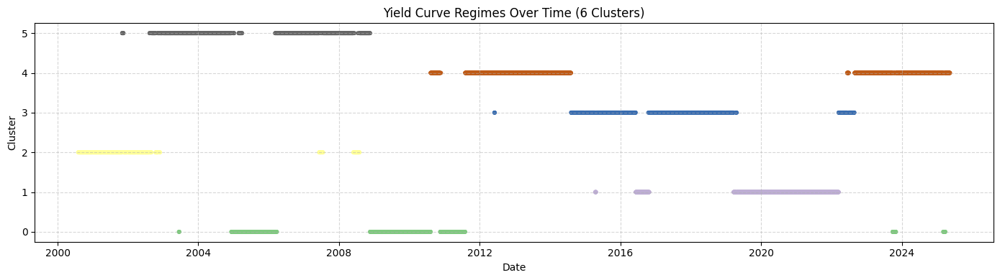

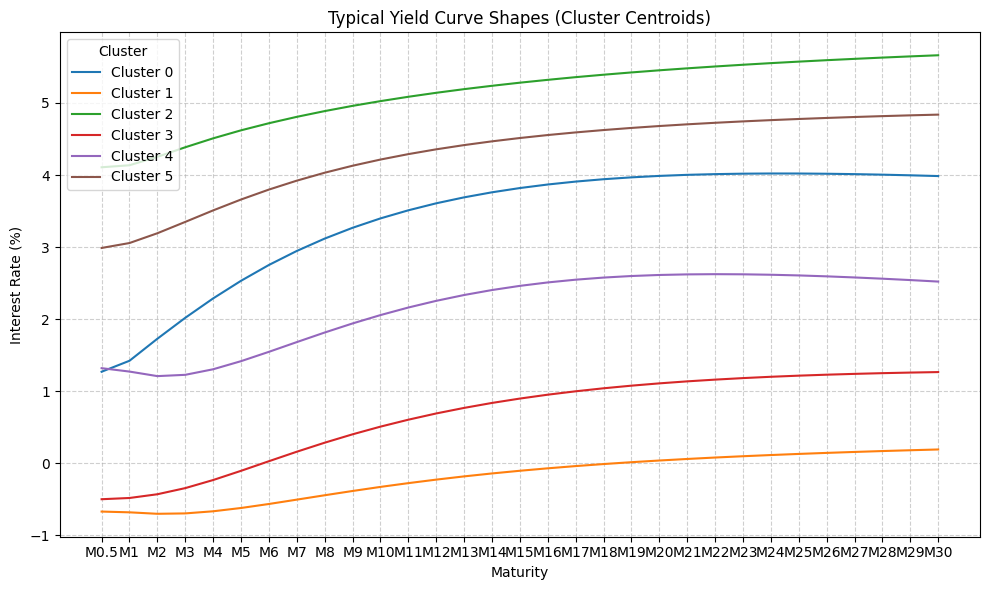

In [ ]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

# Drop missing data
clustering_df = merged_df[maturity_cols].dropna()

# Standardize data
scaler = StandardScaler()
X = scaler.fit_transform(clustering_df)

# Fit k-means with fewer clusters
n_clusters = 6
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
labels = kmeans.fit_predict(X)

# Add labels to DataFrame
clustering_df = clustering_df.copy()
clustering_df["Date"] = merged_df["Date"].loc[clustering_df.index]
clustering_df["Cluster"] = labels

# Plot cluster membership over time
plt.figure(figsize=(14, 4))
plt.scatter(clustering_df["Date"], clustering_df["Cluster"], c=labels, cmap='Accent', s=10)
plt.title(f"Yield Curve Regimes Over Time ({n_clusters} Clusters)")
plt.xlabel("Date")
plt.ylabel("Cluster")
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

# Plot cluster centroids as yield curves
centroids = kmeans.cluster_centers_
centroids_unscaled = scaler.inverse_transform(centroids)

plt.figure(figsize=(10, 6))
for i, curve in enumerate(centroids_unscaled):
    plt.plot(maturity_cols, curve, label=f"Cluster {i}")
plt.title("Typical Yield Curve Shapes (Cluster Centroids)")
plt.xlabel("Maturity")
plt.ylabel("Interest Rate (%)")
plt.grid(True, linestyle='--', alpha=0.6)
plt.legend(title="Cluster")
plt.tight_layout()
plt.show()


In [ ]:
# After inspecting the centroid curves visually:
cluster_labels = {
    0: "Inverted",
    1: "Flat",
    2: "Normal Upward",
    3: "Steep",
    4: "Humped",
    5: "Tight Mid-Curve"
}

# Add named labels
clustering_df["Cluster Label"] = clustering_df["Cluster"].map(cluster_labels)

In [ ]:
# Filter all inverted yield curve dates
inverted_dates = clustering_df[clustering_df["Cluster Label"] == "Inverted"][["Date"]]
print("\n🗓️ Inverted Yield Curve Dates:\n")
print(inverted_dates.head(10))  # show first 10

# Count by year for frequency
clustering_df["Year"] = pd.to_datetime(clustering_df["Date"]).dt.year
regime_counts = clustering_df.groupby(["Year", "Cluster Label"]).size().unstack().fillna(0)
print("\n📊 Cluster Frequencies Per Year:\n")
print(regime_counts)


🗓️ Inverted Yield Curve Dates:

           Date
1489 2003-06-13
1490 2003-06-16
1491 2003-06-17
1871 2004-12-09
1872 2004-12-10
1873 2004-12-13
1874 2004-12-14
1875 2004-12-15
1876 2004-12-16
1877 2004-12-17

📊 Cluster Frequencies Per Year:

Cluster Label   Flat  Humped  Inverted  Normal Upward  Steep  Tight Mid-Curve
Year                                                                         
2000             0.0     0.0       0.0          106.0    0.0              0.0
2001             0.0     0.0       0.0          243.0    0.0             10.0
2002             0.0     0.0       0.0          187.0    0.0             66.0
2003             0.0     0.0       3.0            0.0    0.0            250.0
2004             0.0     0.0      13.0            0.0    0.0            244.0
2005             0.0     0.0     234.0            0.0    0.0             23.0
2006             0.0     0.0      51.0            0.0    0.0            204.0
2007             0.0     0.0       0.0           22.0  

Inversion Regimes are Detectable and Rare:

- Use this to justify stress scenario selection based on empirical frequency.

Regime Transitions Are Periodic and Interpretable:

- Could use clusters to calibrate multi-regime models or regime-switching VaR.

Cluster Labels Provide a Risk-Based Narrative:

- “Flat in 2020–2021” tells a different story than “Inverted in 2009”.

In [ ]:
clustering_df.groupby("Cluster Label")[maturity_cols].std()


,M0.5,M1,M2,M3,M4,M5,M6,M7,M8,M9,...,M21,M22,M23,M24,M25,M26,M27,M28,M29,M30
Cluster Label,,,,,,,,,,,,,,,,,,,,,
Flat,0.069755,0.068342,0.090101,0.117125,0.139719,0.156411,0.169632,0.180585,0.189674,0.197877,...,0.249669,0.251519,0.253452,0.255361,0.256804,0.258324,0.259672,0.261007,0.262253,0.263283
Humped,1.448607,1.359639,1.185470,1.032254,0.903096,0.792371,0.695744,0.610823,0.536842,0.473718,...,0.302183,0.303511,0.304169,0.304520,0.304504,0.304558,0.304434,0.303794,0.303526,0.303117
Inverted,0.852826,0.798624,0.675040,0.568500,0.479179,0.405827,0.348106,0.306062,0.279340,0.265752,...,0.337081,0.339086,0.340615,0.341807,0.342773,0.343818,0.344684,0.346403,0.347955,0.350049
Normal Upward,0.646937,0.603098,0.516357,0.437996,0.374874,0.326517,0.290186,0.264565,0.247287,0.236600,...,0.265738,0.271338,0.277123,0.282710,0.288025,0.293952,0.299377,0.304641,0.310194,0.315566
Steep,0.274136,0.292593,0.319579,0.326537,0.321074,0.310529,0.298804,0.288857,0.281637,0.278122,...,0.320708,0.320575,0.319462,0.317857,0.315451,0.312636,0.309390,0.306076,0.302737,0.299112
Tight Mid-Curve,0.853872,0.800929,0.664833,0.536601,0.429038,0.344775,0.284238,0.246018,0.228118,0.225495,...,0.377853,0.386701,0.394691,0.402236,0.409334,0.416216,0.422781,0.428965,0.434951,0.440840


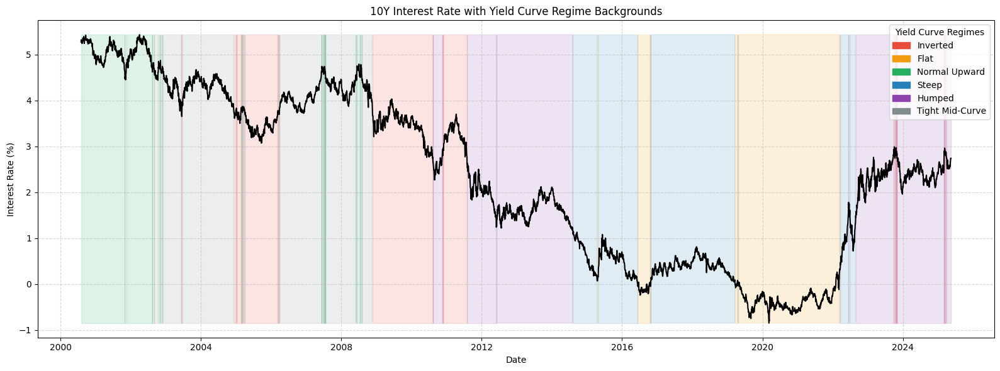

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

# Set up
fig, ax = plt.subplots(figsize=(16, 6))

# Plot the 10Y rate
ax.plot(clustering_df["Date"], clustering_df["M10"], label="10Y Interest Rate", color="black", linewidth=1.5)

# Define cluster color map manually (adjust if needed)
regime_colors = {
    "Inverted": "#e74c3c",         # Red
    "Flat": "#f39c12",             # Orange
    "Normal Upward": "#27ae60",    # Green
    "Steep": "#2980b9",            # Blue
    "Humped": "#8e44ad",           # Purple
    "Tight Mid-Curve": "#7f8c8d"   # Gray
}

# Plot background color for each regime
for label, color in regime_colors.items():
    mask = clustering_df["Cluster Label"] == label
    ax.fill_between(clustering_df["Date"], clustering_df["M10"].min(), clustering_df["M10"].max(),
                    where=mask, color=color, alpha=0.15, label=label)

# Final plot tweaks
ax.set_title("10Y Interest Rate with Yield Curve Regime Backgrounds")
ax.set_xlabel("Date")
ax.set_ylabel("Interest Rate (%)")
ax.grid(True, linestyle='--', alpha=0.5)

# Legend (just one label per color)
handles = [mpatches.Patch(color=color, label=label) for label, color in regime_colors.items()]
ax.legend(handles=handles, title="Yield Curve Regimes", loc="upper right")

plt.tight_layout()
plt.show()


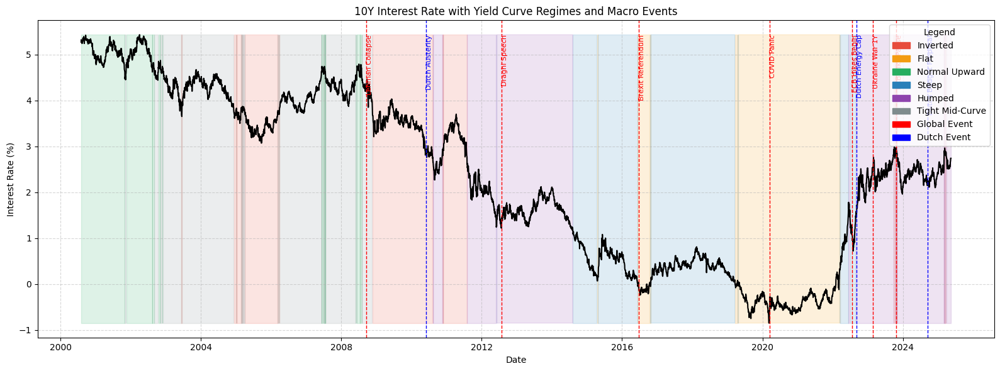

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import pandas as pd

# Define macro events
event_dict = {
    "global": {
        "Lehman Collapse": "2008-09-15",
        "Draghi Speech": "2012-07-26",
        "Brexit Referendum": "2016-06-24",
        "COVID Panic": "2020-03-16",
        "ECB Hikes Begin": "2022-07-21",
        "Ukraine War 1Y": "2023-02-24",
        "ECB Hike Pause": "2023-10-26"
    },
    "dutch": {
        "Dutch Austerity": "2010-06-01",
        "Dutch Energy Cap": "2022-09-06",
        "Dutch Budget Proposal": "2024-09-15"
    }
}

# Define regime colors
regime_colors = {
    "Inverted": "#e74c3c",         # Red
    "Flat": "#f39c12",             # Orange
    "Normal Upward": "#27ae60",    # Green
    "Steep": "#2980b9",            # Blue
    "Humped": "#8e44ad",           # Purple
    "Tight Mid-Curve": "#7f8c8d"   # Gray
}

# Set up plot
fig, ax = plt.subplots(figsize=(16, 6))

# Plot 10Y interest rate
ax.plot(clustering_df["Date"], clustering_df["M10"], label="10Y Interest Rate", color="black", linewidth=1.5)

# Plot regime background colors
for label, color in regime_colors.items():
    mask = clustering_df["Cluster Label"] == label
    ax.fill_between(clustering_df["Date"], clustering_df["M10"].min(), clustering_df["M10"].max(),
                    where=mask, color=color, alpha=0.15)

# Overlay macro events (global - red, dutch - blue)
for label, date in event_dict["global"].items():
    date_obj = pd.to_datetime(date)
    ax.axvline(date_obj, color='red', linestyle='--', linewidth=1)
    ax.text(date_obj, clustering_df["M10"].max(), label, rotation=90,
            verticalalignment='top', fontsize=8, color='red')

for label, date in event_dict["dutch"].items():
    date_obj = pd.to_datetime(date)
    ax.axvline(date_obj, color='blue', linestyle='--', linewidth=1)
    ax.text(date_obj, clustering_df["M10"].max(), label, rotation=90,
            verticalalignment='top', fontsize=8, color='blue')

# Final formatting
ax.set_title("10Y Interest Rate with Yield Curve Regimes and Macro Events")
ax.set_xlabel("Date")
ax.set_ylabel("Interest Rate (%)")
ax.grid(True, linestyle='--', alpha=0.5)

# Add custom legend
regime_handles = [mpatches.Patch(color=color, label=label) for label, color in regime_colors.items()]
macro_handles = [
    mpatches.Patch(color="red", label="Global Event"),
    mpatches.Patch(color="blue", label="Dutch Event")
]
ax.legend(handles=regime_handles + macro_handles, loc="upper right", title="Legend")

plt.tight_layout()
plt.show()


# EGON DRAFT TESTS END

#NATHALIA SECTION


8. Drawdown Plots
Purpose: Measure max negative swings over time.

Method: Cumulative returns logic on yields or their inverse (e.g., bond prices).

9. Volatility Clustering Plots
Purpose: Show periods of persistent high/low volatility.

Method 1: Rolling standard deviation over time.

Method 2: Plot squared daily changes.

Optional (Advanced) Visuals:
Copula-based contour plots (if modelling tail dependencies non-linearly).

Eigenvalue time stability: to monitor PCA factor stability over years.

## **<font color='#474747'>2.2 - Extreme Movements & Volatility Structure**

In [ ]:
# --------------------------IMPORTS ----------------------------------#
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import re
from scipy.stats import norm, probplot



# Create visualizations for each requirement
import matplotlib.dates as mdates



### **<font color='#474747'>*2.2.1 - Daily Changes Analysis*</font>**

Add Column Delta Interest Rate (per file)

In [ ]:
# --------------------------DELAT I.R ----------------------------------#
# Create a new column called "Delta Interest Rate" for each dataframe in the list
# This column is the difference in interest rate from the previous row, with the first value set to 0

for df in dataframes:
    df["Delta Interest Rate"] = df["Interest Rate"].diff().fillna(0)


Plot the Delta Interest Rates Over Time (per Maturity)

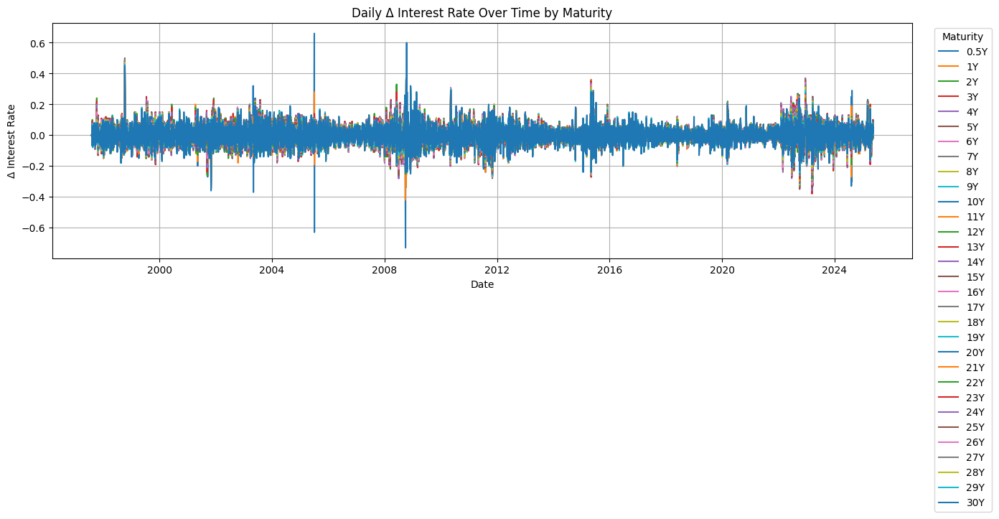

In [ ]:
# -------------------------- PLOT DELTA I.R OVER TIME ----------------------------------#
# Create a time series plot of Delta Interest Rate over time per maturity
fig, ax = plt.subplots(figsize=(14, 6))

for df in dataframes:
    # Extract maturity (ensure consistent format)
    if "Maturity" in df.columns:
        maturity = df["Maturity"].iloc[0]
    else:
        file_name = df["FileReferenceName"].iloc[0]
        match = re.search(r"R(\d+)X", file_name)
        maturity = float(match.group(1)) / 10 if match else 0.0

    ax.plot(df["Date"], df["Delta Interest Rate"], label=f"{maturity}Y")

ax.set_title("Daily Δ Interest Rate Over Time by Maturity")
ax.set_xlabel("Date")
ax.set_ylabel("Δ Interest Rate")
ax.legend(title="Maturity", bbox_to_anchor=(1.02, 1), loc="upper left")
ax.grid(True)
plt.tight_layout()
plt.show()


Heatmap of Delta Interest Rates per Maturity
- Count
- Percenatge

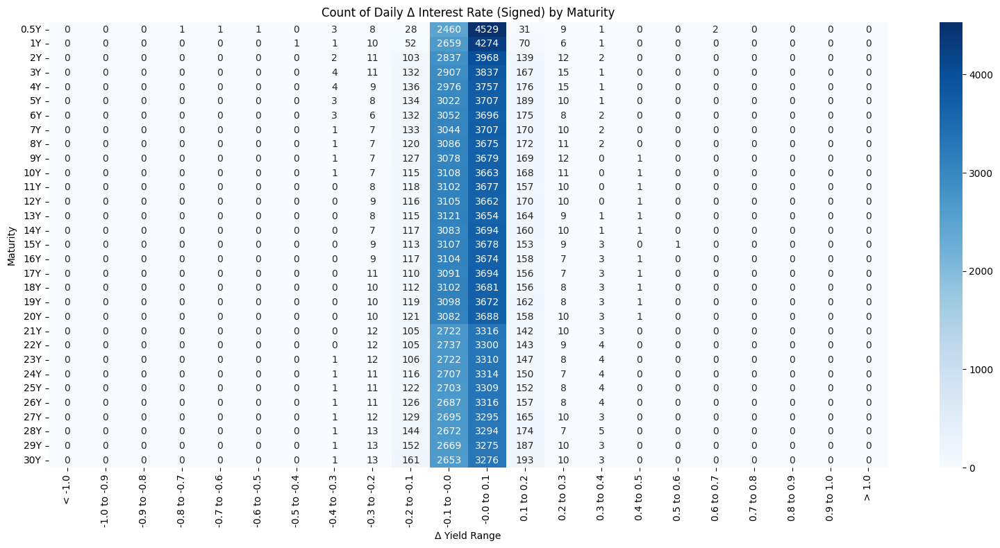

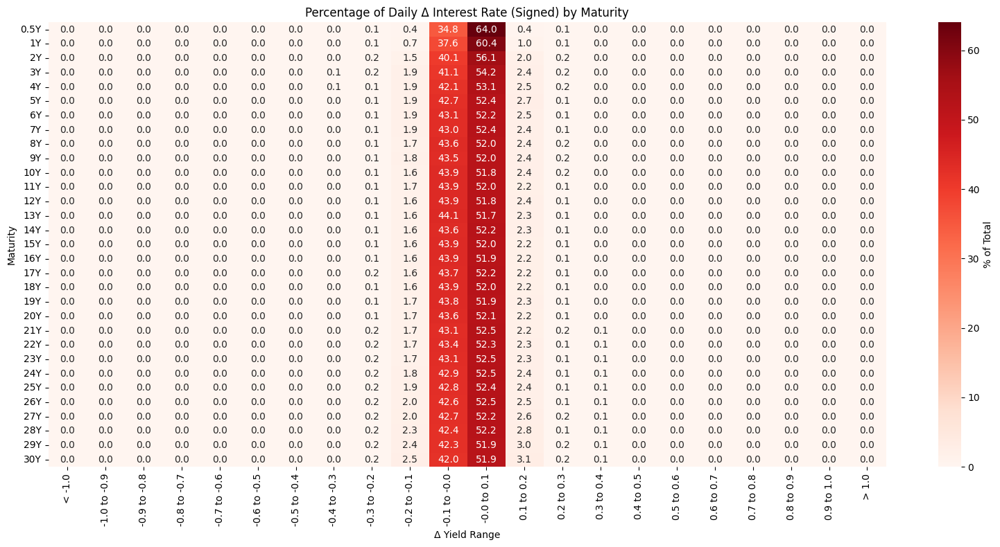

In [ ]:
# -------------------------- HEATMAP OF DELTA I.R'S OVER TIME ----------------------------------#
# Create signed delta bins from < -1.0 to > 1.0 in 0.1 increments
bins = np.arange(-1.0, 1.1, 0.1)
bin_labels = [f"{round(bins[i], 1)} to {round(bins[i+1], 1)}" for i in range(len(bins) - 1)]
bin_labels = ["< -1.0"] + bin_labels + ["> 1.0"]
bin_edges = [-np.inf] + bins.tolist() + [np.inf]

# Initialize matrices
delta_signed_count_matrix = pd.DataFrame(columns=["Maturity"] + bin_labels + ["Total Count"])
delta_signed_pct_matrix = pd.DataFrame(columns=["Maturity"] + bin_labels + ["Sum %"])

# Loop through each dataframe
for df in dataframes:
    maturity = df["Maturity"].iloc[0] if "Maturity" in df.columns else 0
    deltas = df["Delta Interest Rate"]

    # Bin signed deltas
    counts = pd.cut(deltas, bins=bin_edges, labels=bin_labels).value_counts().reindex(bin_labels, fill_value=0)
    total_count = counts.sum()
    percentages = (counts / total_count * 100).round(2)
    sum_pct = percentages.sum()

    # Add row to matrices
    delta_signed_count_matrix.loc[len(delta_signed_count_matrix)] = [f"{maturity}Y"] + counts.tolist() + [total_count]
    delta_signed_pct_matrix.loc[len(delta_signed_pct_matrix)] = [f"{maturity}Y"] + percentages.tolist() + [sum_pct]

# Set index for heatmap rendering
delta_signed_count_matrix.set_index("Maturity", inplace=True)
delta_signed_pct_matrix.set_index("Maturity", inplace=True)

# Heatmap 1: Count of signed delta values per bin
plt.figure(figsize=(16, 8))
sns.heatmap(delta_signed_count_matrix.iloc[:, :-1].astype(int), annot=True, fmt="d", cmap="Blues")
plt.title("Count of Daily Δ Interest Rate (Signed) by Maturity")
plt.xlabel("Δ Yield Range")
plt.ylabel("Maturity")
plt.tight_layout()
plt.show()

# Heatmap 2: Percentage of signed delta values per bin
plt.figure(figsize=(16, 8))
sns.heatmap(delta_signed_pct_matrix.iloc[:, :-1].astype(float), annot=True, fmt=".1f", cmap="Reds", cbar_kws={"label": "% of Total"})
plt.title("Percentage of Daily Δ Interest Rate (Signed) by Maturity")
plt.xlabel("Δ Yield Range")
plt.ylabel("Maturity")
plt.tight_layout()
plt.show()


Analysis per Cluster/ Increment
In order to see:
* Where volatility tends to cluster.
* Whether extreme movements favor certain maturities.

<ipython-input-203-a874ab52eccf>:51: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=maturities, y=pcts, ax=ax, palette="crest")
<ipython-input-203-a874ab52eccf>:51: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=maturities, y=pcts, ax=ax, palette="crest")
<ipython-input-203-a874ab52eccf>:51: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=maturities, y=pcts, ax=ax, palette="crest")
<ipython-input-203-a874ab52eccf>:51: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` var

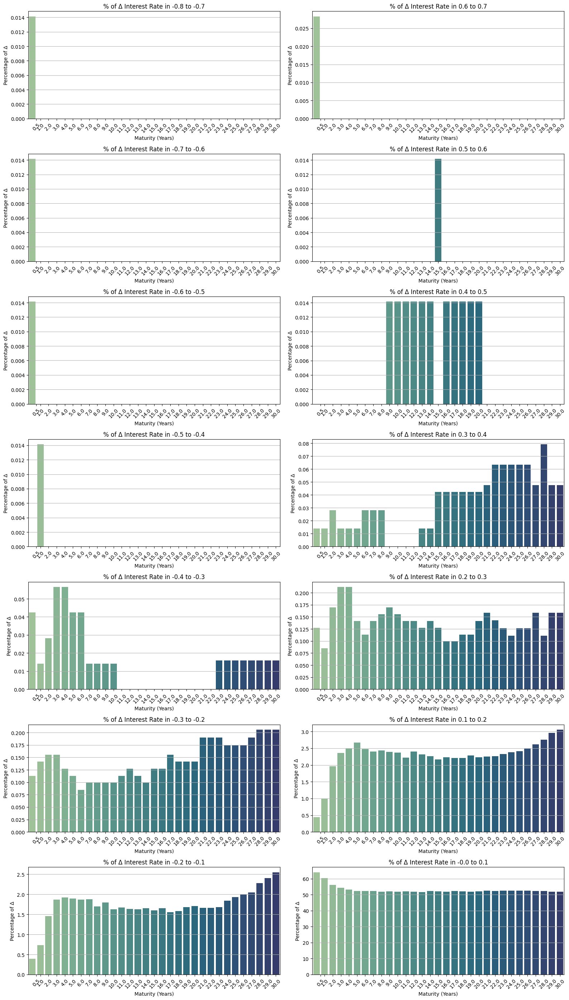

In [ ]:
# -------------------------- PER INCREMENT----------------------------------#

# Define signed bin edges
bin_edges = np.arange(-1.0, 1.1, 0.1)
bin_labels = [f"{round(bin_edges[i], 1)} to {round(bin_edges[i+1], 1)}" for i in range(len(bin_edges) - 1)]

# Step 1: Get total delta count per maturity
maturity_totals = {}
for df in dataframes:
    maturity = df["Maturity"].iloc[0]
    maturity_totals[maturity] = maturity_totals.get(maturity, 0) + df["Delta Interest Rate"].count()

# Step 2: Count number of deltas per bin per maturity
cluster_data_pct = {label: {} for label in bin_labels}
for df in dataframes:
    maturity = df["Maturity"].iloc[0]
    binned = pd.cut(df["Delta Interest Rate"], bins=bin_edges, labels=bin_labels, include_lowest=True)
    bin_counts = binned.value_counts().reindex(bin_labels, fill_value=0)
    for label in bin_labels:
        count = bin_counts[label]
        pct = (count / maturity_totals[maturity]) * 100 if maturity_totals[maturity] > 0 else 0
        cluster_data_pct[label][maturity] = cluster_data_pct[label].get(maturity, 0) + pct

# Step 3: Filter valid bins
valid_bins = [label for label in bin_labels if sum(cluster_data_pct[label].values()) > 0]

# Step 4: Group into symmetric pairs
num_valid = len(valid_bins)
paired_bins = []
for i in range(num_valid // 2):
    paired_bins.append((valid_bins[i], valid_bins[-(i + 1)]))

# Step 5: Plot
if paired_bins:
    num_pairs = len(paired_bins)
    fig, axes = plt.subplots(num_pairs, 2, figsize=(16, 4 * num_pairs), sharex=False)
    if num_pairs == 1:
        axes = np.array([axes])  # Ensure iterable if only one row

    for i, (neg_label, pos_label) in enumerate(paired_bins):
        for j, label in enumerate([neg_label, pos_label]):
            maturity_pcts = cluster_data_pct[label]
            maturities = sorted(maturity_pcts.keys())
            pcts = [maturity_pcts[m] for m in maturities]

            ax = axes[i][j]
            sns.barplot(x=maturities, y=pcts, ax=ax, palette="crest")
            ax.set_title(f"% of Δ Interest Rate in {label}")
            ax.set_xlabel("Maturity (Years)")
            ax.set_ylabel("Percentage of Δ")
            ax.set_xticks(maturities)
            ax.set_xticklabels([f"{m:.1f}" for m in maturities], rotation=45)
            ax.grid(True, axis='y')

    plt.tight_layout()
    plt.show()
else:
    print("No valid delta bins found with data to compare.")


Analysis per Absolute Increment of Delta Interest Rates

<ipython-input-205-89b1941214dc>:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(
<ipython-input-205-89b1941214dc>:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(
<ipython-input-205-89b1941214dc>:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(
<ipython-input-205-89b1941214dc>:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(
<ipython-input-205-89b1941214dc>:20: FutureWarning: 

Passin

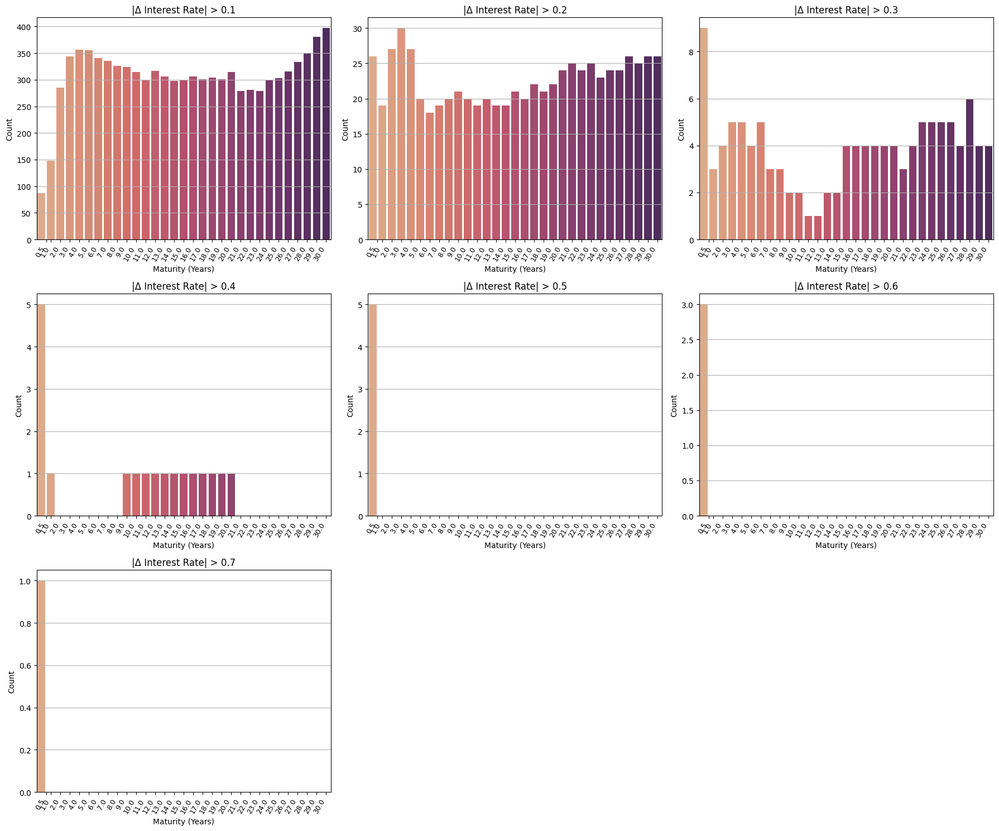

In [ ]:
# -------------------------- ABSOLUTE INCREMENT  ----------------------------------#
# Grid setup
threshold_labels = extreme_matrix.columns[1:]
num_plots = len(threshold_labels)
num_cols = 3
num_rows = (num_plots + num_cols - 1) // num_cols

fig, axes = plt.subplots(num_rows, num_cols, figsize=(18, 5 * num_rows), sharex=False)
axes = axes.flatten()

# Sort maturities
extreme_matrix["Maturity"] = extreme_matrix["Maturity"].astype(float)
extreme_matrix.sort_values("Maturity", inplace=True)

# Plot per threshold
for i, threshold_label in enumerate(threshold_labels):
    ax = axes[i]
    sns.barplot(
        x=extreme_matrix["Maturity"],
        y=extreme_matrix[threshold_label],
        ax=ax,
        palette="flare"
    )
    ax.set_title(f"|Δ Interest Rate| > {threshold_label[1:]}")
    ax.set_xlabel("Maturity (Years)")
    ax.set_ylabel("Count")

    ax.set_xticks(extreme_matrix["Maturity"])
    ax.set_xticklabels([f"{m:.1f}" for m in extreme_matrix["Maturity"]],
                       rotation=60, ha='right', fontsize=9)
    ax.grid(True, axis='y')

# Remove unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


### **<font color='#474747'>*2.2.2 - Normality Analysis/Skewness*</font>**

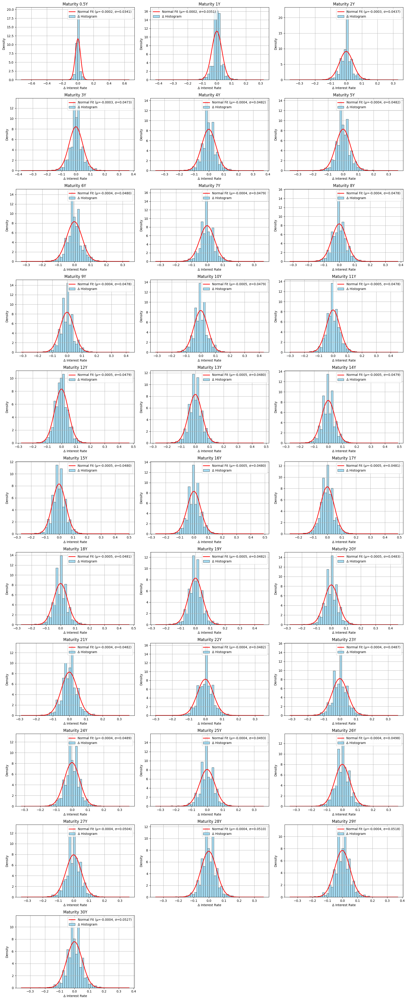

In [ ]:
#----------------------------- SKEWNESS ANALYSIS -----------------------------#
# Setup grid layout: 3 plots per row
num_maturities = len(dataframes)
num_cols = 3
num_rows = (num_maturities + num_cols - 1) // num_cols

fig, axes = plt.subplots(num_rows, num_cols, figsize=(18, 4 * num_rows))
axes = axes.flatten()

# Plot each maturity histogram with normal overlay
for i, df in enumerate(dataframes):
    maturity = df["Maturity"].iloc[0]
    deltas = df["Delta Interest Rate"].dropna()

    mu, std = norm.fit(deltas)
    x = np.linspace(deltas.min(), deltas.max(), 200)
    p = norm.pdf(x, mu, std)

    ax = axes[i]
    sns.histplot(deltas, bins=50, kde=False, stat="density", color="skyblue", ax=ax, label="Δ Histogram")
    ax.plot(x, p, 'r', linewidth=2, label=f"Normal Fit (μ={mu:.4f}, σ={std:.4f})")

    ax.set_title(f"Maturity {maturity}Y")
    ax.set_xlabel("Δ Interest Rate")
    ax.set_ylabel("Density")
    ax.legend()
    ax.grid(True)

# Remove unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()



###### **2.2.2.1 - QQ Plots**
* Show deviation from normality (e.g., heavier tails)

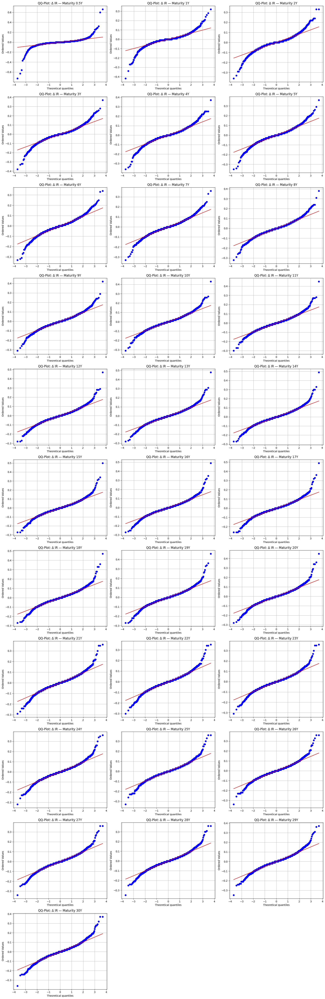

In [ ]:
#-----------------------------  QQ-Plots (Quantile-Quantile) -----------------------------#
# Setup grid layout: 3 plots per row
num_maturities = len(dataframes)
num_cols = 3
num_rows = (num_maturities + num_cols - 1) // num_cols

fig, axes = plt.subplots(num_rows, num_cols, figsize=(18, 5 * num_rows))
axes = axes.flatten()

# Generate QQ-plots per maturity
for i, df in enumerate(dataframes):
    maturity = df["Maturity"].iloc[0]
    deltas = df["Delta Interest Rate"].dropna()

    ax = axes[i]
    stats.probplot(deltas, dist="norm", plot=ax)
    ax.set_title(f"QQ-Plot: Δ IR — Maturity {maturity}Y")
    ax.grid(True)

# Remove unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


**Interpretation Guide**:
1. Straight Diagonal Fit (Blue ≈ Red)
Good normality.

Your data's quantiles align with a normal distribution.

Mostly happens in the middle of the distribution (around mean).

2. S-Shaped Curve
Fat tails or skewness.

If points bend away from the line at both ends, you have fat tails — more extreme events than a normal distribution predicts.

Often seen in financial returns, including interest rate changes.

3. Left-Tail Deviation
If points fall below the red line on the left side:
→ Left skew (more negative outliers than expected).

4. Right-Tail Deviation
If points rise above the red line on the right side:
→ Right skew (more large positive outliers).
<br>

Your Plots (from the image):
Most maturities show:
* A clear S-shape: suggesting non-normality.
* Heavy tails: more extreme Δ interest rate changes than a normal curve would expect.
* Often a slight right skew (upper tail curves up), especially in shorter maturities.
* This behavior is quite common in financial time series, especially interest rate movements, and confirms why models often use distributions beyond the normal (e.g., t-distribution, GARCH, or jump-diffusion).



### **<font color='#474747'>*2.2.3 - Drawdown Plots*</font>**

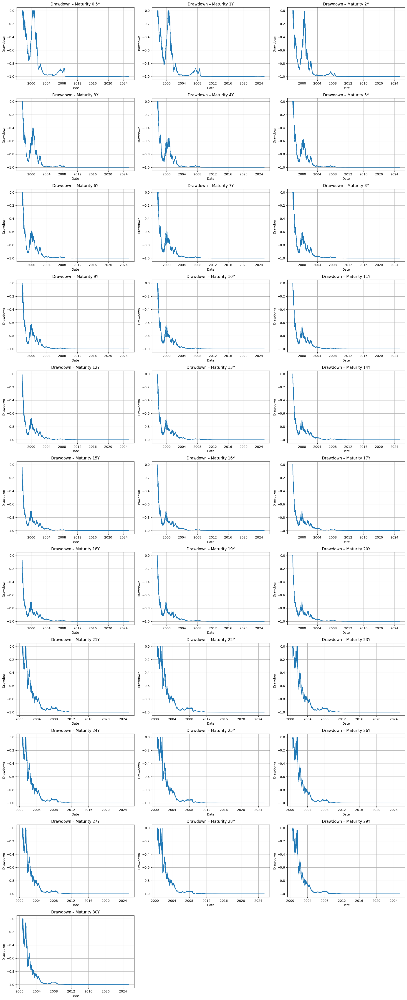

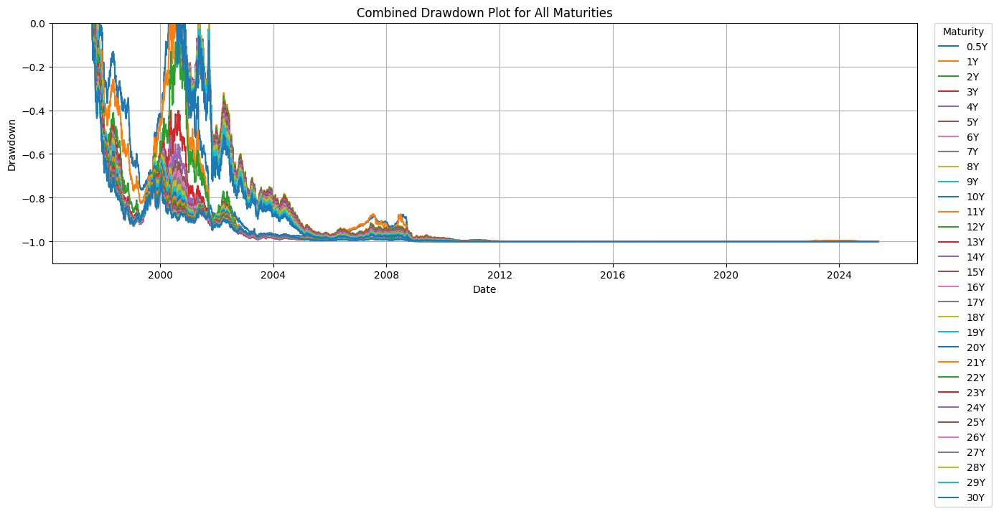

In [ ]:
#----------------------------- 8. Drawdown Plots -----------------------------#

# Improved Drawdown Plot: Right-side legend & full y-axis range
# --- Individual Drawdown Plots (3 per row) ---
num_maturities = len(dataframes)
num_cols = 3
num_rows = (num_maturities + num_cols - 1) // num_cols

fig, axes = plt.subplots(num_rows, num_cols, figsize=(18, 4 * num_rows), sharex=False)
axes = axes.flatten()

for i, df in enumerate(dataframes):
    maturity = df["Maturity"].iloc[0]
    deltas = df["Delta Interest Rate"].fillna(0)
    safe_deltas = deltas.clip(lower=-0.99)

    cumulative = (1 + safe_deltas).cumprod()
    rolling_max = cumulative.cummax()
    drawdown = (cumulative - rolling_max) / rolling_max

    ax = axes[i]
    ax.plot(df["Date"], drawdown, label=f"{maturity}Y")
    ax.set_title(f"Drawdown – Maturity {maturity}Y")
    ax.set_xlabel("Date")
    ax.set_ylabel("Drawdown")
    ax.grid(True)

# Remove unused axes
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

# --- Combined Final Drawdown Plot ---
fig, ax = plt.subplots(figsize=(14, 6))
min_drawdown = 0

for df in dataframes:
    maturity = df["Maturity"].iloc[0]
    deltas = df["Delta Interest Rate"].fillna(0)
    safe_deltas = deltas.clip(lower=-0.99)

    cumulative = (1 + safe_deltas).cumprod()
    rolling_max = cumulative.cummax()
    drawdown = (cumulative - rolling_max) / rolling_max

    if drawdown.nunique() > 1:
        ax.plot(df["Date"], drawdown, label=f"{maturity}Y")
        min_drawdown = min(min_drawdown, drawdown.min())

ax.set_title("Combined Drawdown Plot for All Maturities")
ax.set_xlabel("Date")
ax.set_ylabel("Drawdown")
ax.set_ylim(min_drawdown * 1.1, 0)
ax.legend(title="Maturity", bbox_to_anchor=(1.02, 1), loc="upper left", borderaxespad=0)
ax.grid(True)

plt.tight_layout()
plt.show()


How to Read the Plot:
1. Deep Troughs (Large Negative Values)
Indicate significant downward movements in the Δ interest rate trend.

Example: a sharp spike in interest rates followed by a period of falling Δs.

2. Wide/Long Drawdowns
Show long periods without recovery to prior peaks.

Common in low-volatility environments with sudden spikes.

3. Quick Recovery
A sharp V-shape suggests a fast rebound.

Seen in short-term reversals.

In Your Image:
Most maturities show:

Drawdowns clustered in the early 2000s: indicating interest rate delta trends were volatile or structurally shifting then.

Flat drawdowns near -1 afterward: implies rates haven’t returned to those previous Δ levels or cumulative Δs haven’t peaked again.

This is consistent with a structural shift toward lower and more stable interest rate volatility over the past 15+ years.


When It’s Useful:
Risk Management: highlights worst-case stress periods.

Model Testing: calibrate volatility and stress scenarios.

Portfolio Duration Management: longer durations often show slower recovery (you can observe this in drawdown depth and slope).

### **<font color='#474747'>*2.2.4 - Volatility Clustering*</font>**

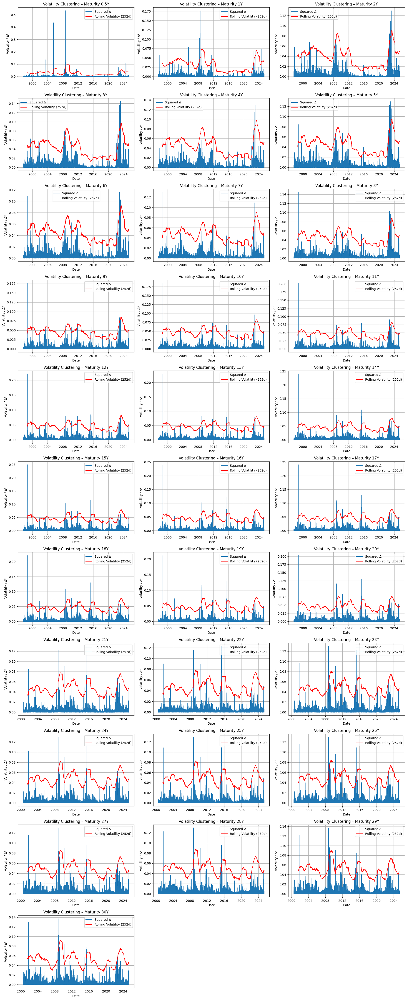

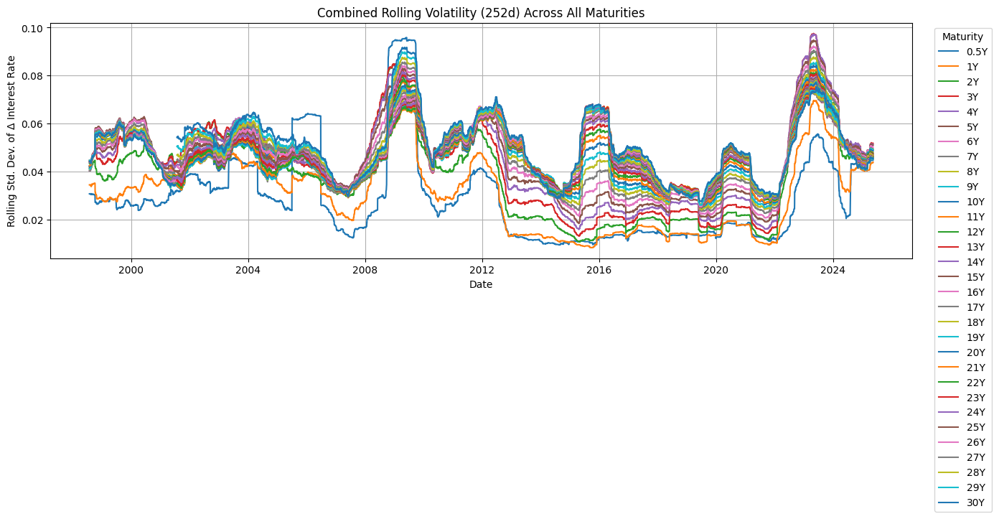

In [ ]:
# ----------------------------- 9. Volatility Clustering ----------------------------- #

# Set up layout: 3 plots per row for individual maturities
num_maturities = len(dataframes)
num_cols = 3
num_rows = (num_maturities + num_cols - 1) // num_cols

fig, axes = plt.subplots(num_rows, num_cols, figsize=(18, 4 * num_rows))
axes = axes.flatten()

# Individual Volatility Clustering Plots
for i, df in enumerate(dataframes):
    maturity = df["Maturity"].iloc[0]
    deltas = df["Delta Interest Rate"].fillna(0)

    rolling_vol = deltas.rolling(window=252).std()
    squared_deltas = deltas**2

    ax = axes[i]
    ax.plot(df["Date"], squared_deltas, label="Squared Δ")
    ax.plot(df["Date"], rolling_vol, color='red', label="Rolling Volatility (252d)")
    ax.set_title(f"Volatility Clustering – Maturity {maturity}Y")
    ax.set_xlabel("Date")
    ax.set_ylabel("Volatility / Δ²")
    ax.legend()
    ax.grid(True)

# Remove unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

# ----------------------------- Combined Plot for All Maturities ----------------------------- #
fig, ax = plt.subplots(figsize=(14, 6))

for df in dataframes:
    maturity = df["Maturity"].iloc[0]
    deltas = df["Delta Interest Rate"].fillna(0)
    rolling_vol = deltas.rolling(window=252).std()

    ax.plot(df["Date"], rolling_vol, label=f"{maturity}Y")

ax.set_title("Combined Rolling Volatility (252d) Across All Maturities")
ax.set_xlabel("Date")
ax.set_ylabel("Rolling Std. Dev. of Δ Interest Rate")
ax.legend(title="Maturity", bbox_to_anchor=(1.02, 1), loc="upper left")
ax.grid(True)

plt.tight_layout()
plt.show()


**How to Interpret Volatility Clustering (Interest Rate Δ)**

Your plots show:
* Blue bars = squared daily changes in interest rates (Δ²)
* Red line = rolling volatility (252-day standard deviation)
<br>
<br>

**What is Volatility Clustering?**<br>
Volatility clustering is the phenomenon where:
* Large changes tend to be followed by large changes (of either sign)
* Small changes tend to be followed by small changes
This is not random noise—it’s a core feature of financial time series.

<br>

**How to Interpret Each Plot:**
1. Spikes in Squared Δ: Large spikes indicate rate shocks.
  * High clustering = several spikes grouped in time (not isolated).

2. Elevated Red Line
   * The red line reacts slower, showing persistent volatility over months.
  * If the red line stays elevated, you’re in a volatile regime.

3. Flat Red Line + No Blue Spikes
  * Indicates stable interest rate movements.
  * Often seen in policy-driven low-rate environments.
<br>

**In Your Image:**<br>
Around 2008, 2020, and 2022–2023:
* You see volatility spikes across most maturities.
* This suggests systemic shifts or shocks (e.g., GFC, COVID, inflation regimes).
* Volatility decay is slow:
    * This confirms clustering — shocks don’t fade immediately.
<br>

**Why It Matters:**
* Helps justify the use of GARCH models, not constant volatility.
* Essential for stress testing, risk budgeting, and scenario design.
* Shows how policy-sensitive maturities (short end) behave differently from long end.

